# Import libraries

In [2]:
!pip install arch

import yfinance as yf
import pandas as pd
import datetime
import numpy as np
from time import time

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import matplotlib.pyplot as plt
import pandas_datareader.data as web
import seaborn as sns
#from pandas.plotting import scatter_matrix

from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import mean_squared_error

import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from keras.regularizers import l1_l2

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from arch.unitroot import PhillipsPerron
import itertools

# import tensorflow as tf
# from keras.regularizers import l1_l2
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense
# from tensorflow.keras import regularizers



[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: pip install --upgrade pip


ModuleNotFoundError: No module named 'keras.wrappers'

# Download Data

### CCAR Variables

In [3]:
# Time period
end = '2023-04-30'
start = '1982-1-1'

# FRED, Bloomberg, Yahoo Finance Data
Y_ticker = ["^VIX"]
X_ticker1 = ["SPY","GC=F","DX-Y.NYB"]
Fred_data1 = ["GDP","GDPC1","A067RL1Q156SBEA","A067RP1Q027SBEA","UNRATE","CPIAUCSL","TB3MS","GS5","GS10","MPRIME","BOGZ1FL075035243Q","BOGZ1FL075035503Q"]
Fred_data2 = ["MORTGAGE30US"]
#X1 = yf.download(Y_ticker, start=start, end=end, progress = False,group_by="ticker")
X2 = web.DataReader(Fred_data1,'fred',start,end)
Y = yf.download(Y_ticker, start=start, end=end, progress = False,group_by="ticker")
Y = pd.DataFrame(Y['Adj Close'])
X3 = web.DataReader(Fred_data2,'fred','1981-12-01','2023-04-30')
Dow_jones = web.DataReader('BOGZ1FL073164013Q','fred',start,end)
#Y_SPX = yf.download('^SPX',start='2010-04-30', end='2023-04-30', progress = False,group_by="ticker")
#Y_SPX = pd.DataFrame(Y_SPX['Adj Close'])


### Additional Variables

In [ ]:
# FRED, Bloomberg, Yahoo Finance Data
Fred_data3 = ["UMCSENT","DFF","PPIACO","M1SL","M2SL","ICSA","STLFSI4","BAMLC0A4CBBB"]

#X1 = yf.download(Y_ticker, start=start, end=end, progress = False,group_by="ticker")
X2_add = web.DataReader(Fred_data3,'fred',start,end)
dollar= yf.download('DX-Y.NYB', start=start, end=end, progress = False,group_by="ticker")
dollar = pd.DataFrame(dollar['Adj Close'])
option_vols = pd.read_excel('C:\\Users\\sauvi\\3. Summer Project - VIX\\Option Volume Data.xlsx',index_col ='Dates')
option_vols.index.name = "Date"
index_vols = pd.read_excel('C:\\Users\\sauvi\\3. Summer Project - VIX\\SPX,DJIA_Vol_MktCap.xlsx',index_col ='Dates')
index_vols.index.name = "Date"

In [ ]:
# S&P 500 Options volume 
call_vol = option_vols['CBOE SP500 Call volume']
put_vol = option_vols['CBOE SP500 Put volume']
option_volume = pd.concat([call_vol,put_vol],axis=1)
option_volume = pd.DataFrame(option_volume.dropna())
option_volume


# S&P 500 market volume
SPX_index_vols_cap = pd.DataFrame(index_vols.iloc[:,:2]).dropna()
SPX_index_vols_cap

### Define Column names

In [1]:
# Define column names
col_name1={'GDP':'Nom GDP', 'GDPC1':'Real GDP','A067RL1Q156SBEA':'Real Disp Income','A067RP1Q027SBEA':'Nom Disp Income','UNRATE':'Unemp Rate','CPIAUCSL':'CPI','TB3MS':'3m TSY','GS5':'5Y TSY','GS10':'10Y TSY','MPRIME':'Prime Rate', 'BOGZ1FL075035243Q': 'HPI', 'BOGZ1FL075035503Q': 'Commercial REI'}
col_name2 = {'MORTGAGE30US':'Mortgage Rate'}
dj_col = {'BOGZ1FL073164013Q':'Dow Jones Total'}
Y_col = {'Adj Close':'VIX'}

# Additional variables column names
col_names_add = {'UMCSENT':'MCSI', 'DFF': 'EFFR', 'PPIACO': 'PPI', 'M1SL': 'M1','M2SL':'M2','ICSA': 'ICSA','STLFSI4': 'Federal Stress Index','BAMLC0A4CBBB': 'OAS BBB Corp'}
dollar_col = {'Adj Close': 'Dollar'}

# Functions

In [4]:
# Function to convert datetime to date only
def date_time(S):
    S.index = S.index.date
    S.index = pd.to_datetime(S.index)
    return S

In [5]:
# Function to rename columns
def rename_columns(S,column_name):
    S = S.rename(columns=column_name)
    return S

In [6]:
# Function to convert weekly to monthly data (One period forward shift)
def weekly_to_monthly(S):
    monthly = S.resample('MS').mean()
    monthly.index = monthly.index.shift(1,freq='MS')
    return monthly

In [7]:
# Function to calculate growth rate and convert to month
def growth_calc_to_monthly(S,n):
    growth1 = pd.DataFrame(S.dropna())
    growth2 = (((1+ growth1.pct_change())**4)-1)*100
    growth2.index = growth2.index.shift(3,freq='MS')
    growth2 = growth2.asfreq('MS',method='ffill')/n
    return growth2

In [8]:
# Function to convert quarterly to monthly (Forwardfill)
def quarterly_to_monthly_forwardfill(S,n):
    monthly = pd.DataFrame(S.dropna())
    monthly.index = monthly.index.shift(3,freq='MS')
    monthly = monthly.asfreq('MS',method='ffill')/n
    return monthly

In [9]:
# Function to convert quarterly to monthly (Backfill)
def quarterly_to_monthly_backfill(S,n):
    monthly = pd.DataFrame(S.dropna().asfreq('MS',method='bfill')/n)
    return monthly

In [10]:
# Function to generate a heatmap with lead or lag in all variables vs target variable
# Zero for lag and 1 for lead variables
# Numshifts is the number of lead/lags
# Data1 contains all variables and the target varible is the last column of data1

def leadlagheatmap(data1, numshifts, zero_or_one, l, b):
    plt.figure(figsize=(l, b))
    if zero_or_one == 0:
        target = data1.iloc[:,-1].shift(numshifts)
        vars = data1.iloc[0:-numshifts,0:-1]
        comblagged = pd.concat([vars, target], axis=1)
        comblagged = comblagged.dropna()
    else:
        target = data1.iloc[0:-numshifts,-1]
        vars = data1.iloc[:,0:-1].shift(numshifts)
        comblagged = pd.concat([vars, target], axis=1)
        comblagged = comblagged.dropna()
    return sns.heatmap(comblagged.corr(),annot=True)

In [11]:
# Function to test for stationarity using Augmented Dickey Fuller test (FEED Only DataFrame)
def adf_stationarity_test(S):
    for i in range(S.shape[1]):
        adf = adfuller(S.iloc[:,i])
        if adf[1] < 0.05:
            print('ADFuller Test of Stationarity', S.columns[i], adf[0:2])
        else:
            print('ADFuller Test of Stationarity', S.columns[i], 'is not stationary')

In [12]:
# Function to test for stationarity using Phillips Perros test (FEED Only DataFrame)
def phillips_perron_stationarity_test(S):
    for i in range(S.shape[1]):
        pptest = PhillipsPerron(S.iloc[:,i])
        if pptest.pvalue < 0.05:
            print('PhillipsPerron Test of Stationarity', S.columns[i], pptest.pvalue)
        else:
            print('PhillipsPerron Test of Stationarity', S.columns[i], 'is not stationary')

In [13]:
# Function to test for stationarity using KPSS test (FEED Only DataFrame)
def KPSS_stationarity_test(S):
    for i in range(S.shape[1]):
        kptest = kpss(S.iloc[:,i])
        if kptest[1] > 0.05:
            print('KPSS Test of Stationarity', S.columns[i], kptest[0:2])
        else:
            print('KPSS Test of Stationarity', S.columns[i], 'is not stationary')

In [14]:
# Internal Stationarity Test Function for single variable #### MAKE significance level an input parameter ####
# If at least 2 of the 3 tests ADF, KPSS, PP are passed, the data is stationary
def int_stat_test(varname, vardata):
    # ADF Test
    adfcnt = 0
    adf = adfuller(vardata)
    if adf[1] < 0.05:
        adfcnt = 1
    # KPSS Test
    kpcnt = 0
    kpstest = kpss(vardata)
    if kpstest[1] > 0.05:
        kpcnt = 1
    # PP Test
    ppcnt = 0
    pptest = PhillipsPerron(vardata)
    if pptest.pvalue< 0.05:
        ppcnt = 1
    if adfcnt + kpcnt + ppcnt >= 2:
        print(varname, 'is stationary')
    else:
        print(varname, 'is not stationary')

In [15]:
# Function for Combination of ADF and KPSS Tests
def comb_stat_test(varname, vardata):
    # ADF Test
    adfcnt = 0
    adf = adfuller(vardata)
    if adf[1] < 0.05:
        adfcnt = 1
    # KPSS Test
    kpcnt = 0
    kpstest = kpss(vardata)
    if kpstest[1] > 0.05:
        kpcnt = 1
    # Combination check
    if adfcnt == 1 and kpcnt == 0:
        print('is difference stationary.')
    elif adfcnt == 0 and kpcnt == 1:
        print('is trend stationary.')
    elif adfcnt == 0 and kpcnt == 0:
        print('is not stationary.')
    else:
        print('is stationary.')

In [16]:
# Function to check for seasonality
def seasonalty_check(S,model_type):
    data_columns = S.columns
    for column in data_columns:
        seasonal_decomposition = sm.tsa.seasonal_decompose(S[column], model=model_type)
        # Plot the original time series, trend, seasonal, and residual components
        fig, ax = plt.subplots(4, 1, figsize=(10, 8))
        ax[0].plot(S.index, S[column], label='Original')
        ax[0].legend(loc='best')
        ax[1].plot(S.index, seasonal_decomposition.trend, label='Trend')
        ax[1].legend(loc='best')
        ax[2].plot(S.index, seasonal_decomposition.seasonal, label='Seasonal')
        ax[2].legend(loc='best')
        ax[3].plot(S.index, seasonal_decomposition.resid, label='Residual')
        ax[3].legend(loc='best')
        
        # Set the title of the plot as the column name
        ax[0].set_title(column)
        
        # Show the plots
        plt.tight_layout()
        plt.show()



In [17]:
# Function to plot ACF and PACF
def PACF_ACF_plot(S):
    for column in range(len(S.columns)):
        # Plot PACF
        fig, ax = plt.subplots(figsize=(10, 4))
        plot_pacf(S.iloc[:,column], lags=50, ax=ax)
        ax.set_title('Partial Autocorrelation Function (PACF)')
        plt.title(S.columns[column] + ' PACF')
        plt.show()
        
        # Plot ACF
        fig, ax = plt.subplots(figsize=(10, 4))
        plot_acf(S.iloc[:,column], lags=50, ax=ax)
        ax.set_title('Autocorrelation Function (ACF)')
        plt.title(S.columns[column] + ' ACF')
        plt.show()

In [18]:
# Function for finding out ARIMA pdq order and RMSE
def ARIMA_pdq_order_1(p_range,d_range,q_range,train_y,test_y):
    p_values = range(0, p_range)
    d_values = range(0, d_range)
    q_values = range(0, q_range)
    
    # Initialize variables
    best_rmse = float('inf')
    best_order = None
    
    for p in p_values:
        for d in d_values:
            for q in q_values:
                try:
                    # Create and fit the ARIMAX model
                    model = sm.tsa.ARIMA(train_y, order=(p, d, q))
                    results = model.fit()
                    forecast_ARIMA = results.forecast(steps=len(test_y))
                    rmse = np.sqrt(mean_squared_error(test_y, forecast_ARIMA))
                    
                    # Check if current RMSE is better than the previous best
                    if rmse < best_rmse:
                        best_rmse = rmse
                        best_order = (p, d, q)
                except:
                    continue
    
    # Print the best order values and RMSE
    return "Best Order:",best_order, "Best RMSE:",best_rmse


In [19]:
# Function for finding out ARIMA pdq order and RMSE
def ARIMA_pdq_order(p_range, d_range, q_range, train_y, test_y):
    p_values = range(0, p_range)
    d_values = range(0, d_range)
    q_values = range(0, q_range)
    
    # Initialize variables
    best_rmse = float('inf')
    best_order = None
    
    # Generate all combinations of p, d, q values
    order_combinations = list(itertools.product(p_values, d_values, q_values))
    
    for order in order_combinations:
        try:
            # Create and fit the ARIMA model
            model = sm.tsa.ARIMA(train_y, order=order)
            results = model.fit()
            forecast_ARIMA = results.forecast(steps=len(test_y))
            rmse = np.sqrt(mean_squared_error(test_y, forecast_ARIMA))
            
            # Check if current RMSE is better than the previous best
            if rmse < best_rmse:
                best_rmse = rmse
                best_order = order
        except:
            continue
                    
    # Print the best order values and RMSE
    return "Best Order:", best_order, "Best RMSE:", best_rmse

In [20]:
# Function for finding out ARIMAX pdq order and RMSE
def ARIMAX_pdq_order(p_range, d_range, q_range, train_x, test_x, train_y, test_y):
    p_values = range(0, p_range)
    d_values = range(0, d_range)
    q_values = range(0, q_range)

    # Initialize variables
    best_rmse = float('inf')
    best_order = None

    # Generate all combinations of p, d, q values
    order_combinations = list(itertools.product(p_values, d_values, q_values))

    for order in order_combinations:
        try:
            # Create and fit the ARIMAX model
            model = sm.tsa.ARIMA(train_y, order=order, exog=train_x)
            results = model.fit()
            forecast_ARIMAX = results.forecast(steps=len(test_y), exog=test_x)
            rmse = np.sqrt(mean_squared_error(test_y, forecast_ARIMAX))

            # Check if current RMSE is better than the previous best
            if rmse < best_rmse:
                best_rmse = rmse
                best_order = order

        except:
            continue

    # Print the best order values and RMSE
    return "Best Order:", best_order, "Best RMSE:", best_rmse

# Data Cleaning and Preprocessing

### Renaming columns

In [21]:
# Rename columns by replacing ticker names with actual variable names
fred_1 = rename_columns(X2,col_name1)
fred_2 = rename_columns(X3,col_name2)
Dow_jones_qtr = rename_columns(Dow_jones,dj_col)
Y = rename_columns(Y,Y_col)

# Additonal variables data
fred_3 = rename_columns(X2_add,col_names_add)
dollar = rename_columns(dollar,dollar_col)

NameError: name 'X2' is not defined

In [22]:
from pandas.tseries.offsets import DateOffset
# Changing datetime variables to date only variables
dollar_index = date_time(dollar)
Y_index = date_time(Y)

# Max value of VIX and Last value of Dollar Index
VIX_monthly = Y_index.resample('MS').max()
VIX_monthly.index += DateOffset(months=1)

NameError: name 'dollar' is not defined

### Concatenate All Additiona Variables

### Extracting Data from CCAR variables dataframe

In [25]:
# Extract each variable from dataframe and store in Dataframe
real_gdp_qtr = pd.DataFrame(fred_1['Real GDP'])
nom_gdp_qtr = pd.DataFrame(fred_1['Nom GDP'])
nom_disp_inc_qtr = pd.DataFrame(fred_1['Nom Disp Income'])
real_disp_inc_qtr = pd.DataFrame(fred_1['Real Disp Income'])
unemp_rate_monthly = pd.DataFrame(fred_1['Unemp Rate'])
CPI_monthly = pd.DataFrame(fred_1['CPI'])
tsy_3m_monthly = pd.DataFrame(fred_1['3m TSY'])
tsy_5y_monthly = pd.DataFrame(fred_1['5Y TSY'])
tsy_10y_monthly = pd.DataFrame(fred_1['10Y TSY'])
prime_rate_monthly = pd.DataFrame(fred_1['Prime Rate'])
HPI_qtr = pd.DataFrame(fred_1['HPI'])
REI_qtr = pd.DataFrame(fred_1['Commercial REI'])

### Extracting Data from Additional variables dataframe

In [26]:
# Extract each variable from dataframe and store in Dataframe
mcsi_monthly = pd.DataFrame(fred_3['MCSI'])
ppi_monthly = pd.DataFrame(fred_3['PPI'])
m1_monthly = pd.DataFrame(fred_3['M1'])
m2_monthly = pd.DataFrame(fred_3['M2'])
ICSA_weekly = pd.DataFrame(fred_3['ICSA'])
FSI_weekly = pd.DataFrame(fred_3['Federal Stress Index'])
effr_daily = pd.DataFrame(fred_3['EFFR'])
OAS_BBBcorp_daily = pd.DataFrame(fred_3['OAS BBB Corp'])

### CCAR Variables Data Cleaning

In [27]:
# Convert weekly data to monthly data
mortgage_monthly = weekly_to_monthly(fred_2)

# Convert quarterly data to monthly data
nom_disp_inc_monthly = quarterly_to_monthly_forwardfill(nom_disp_inc_qtr,3)
real_disp_inc_monthly = quarterly_to_monthly_forwardfill(real_disp_inc_qtr,3)
nom_gdp_monthly_growth = growth_calc_to_monthly(nom_gdp_qtr,3)
real_gdp_monthly_growth = growth_calc_to_monthly(real_gdp_qtr,3)
HPI_monthly = quarterly_to_monthly_forwardfill(HPI_qtr,1000)
REI_monthly = quarterly_to_monthly_forwardfill(REI_qtr,1000)
Dow_jones_monthly = quarterly_to_monthly_forwardfill(Dow_jones_qtr,1000)


# Taking percentage of indices 
CPI_monthly_pct = pd.DataFrame(fred_1['CPI'].pct_change()*100)
Dow_jones_qtr_pct = Dow_jones_qtr.pct_change()*100
Dow_jones_qtr_pct = Dow_jones_qtr_pct.dropna()
Dow_jones_qtr_pct_1 = quarterly_to_monthly_forwardfill(Dow_jones_qtr_pct,3)
HPI_qtr_pct = HPI_qtr.dropna()
#HPI_qtr_pct1 = HPI_qtr_pct.pct_change()*100
HPI_qtr_pct2 = quarterly_to_monthly_forwardfill(HPI_qtr_pct.pct_change()*100,3)
REI_qtr_pct = REI_qtr.dropna()
#REI_qtr_pct1 = REI_qtr_pct.pct_change()*100
REI_qtr_pct2 = quarterly_to_monthly_forwardfill(REI_qtr_pct.pct_change()*100,3)

### Additional Variables Data Cleaning

In [28]:
dollar_monthly = dollar_index.resample('MS').last()
dollar_monthly.index += DateOffset(months=1)
#SPX_monthly = Y_SPX.resample('MS').last()

# Additional variables
option_volume_monthly = option_volume.resample('MS').mean()
option_volume_monthly.index = option_volume_monthly.index.shift(1)
option_volume_monthly
put_call_ratio_monthly = pd.DataFrame(option_volume_monthly.iloc[:,1]/option_volume_monthly.iloc[:,0])
put_call_ratio_monthly.columns = ['Put/Call ratio']
put_call_ratio_monthly

SPX_index_vols = pd.DataFrame(SPX_index_vols_cap.iloc[:,1])
SPX_index_mkt_cap = pd.DataFrame(SPX_index_vols_cap.iloc[:,0])
SPX_index_vols_monthly = SPX_index_vols.resample('MS').mean()
SPX_index_vols_monthly.index = SPX_index_vols_monthly.index.shift(1)
SPX_index_mkt_cap_monthly = SPX_index_mkt_cap.resample('MS').last()
SPX_index_mkt_cap_monthly.index = SPX_index_mkt_cap_monthly.index.shift(1)

NameError: name 'option_volume' is not defined

### Percentage change of index values

In [29]:
dollar_monthly_pct = (dollar_monthly.pct_change()*100).dropna()
SPX_index_vols_monthly_pct = (SPX_index_vols_monthly.pct_change()*100).dropna()
SPX_index_mkt_cap_monthly_pct = (SPX_index_mkt_cap_monthly.pct_change()*100).dropna()

NameError: name 'SPX_index_vols_monthly' is not defined

In [30]:
# Function to convert daily to monthly data (One period forward shift)
def daily_to_monthly(S):
    monthly = S.resample('MS').mean()
    monthly.index = monthly.index.shift(1,freq='MS')
    return monthly

In [31]:
# Convert daily data to monthly data
OAS_BBBcorp_monthly = daily_to_monthly(OAS_BBBcorp_daily)
EFFR_monthly = effr_daily.resample('MS').last()
EFFR_monthly.index = EFFR_monthly.index.shift(1)


# Convert weekly data to monthly data
ICSA_monthly = weekly_to_monthly(ICSA_weekly)
FSI_monthly = weekly_to_monthly(FSI_weekly)

# Taking percentage change of indices
mcsi_monthly_pct = (mcsi_monthly.pct_change()*100).dropna()
ppi_monthly_pct = (ppi_monthly.pct_change()*100).dropna()
m1_monthly_pct = (m1_monthly.pct_change()*100).dropna()
m2_monthly_pct = (m2_monthly.pct_change()*100).dropna()
ICSA_monthly_pct = (ICSA_monthly.pct_change()*100).dropna()
FSI_monthly_pct = (FSI_monthly.pct_change()*100).dropna()

### Combining to DataFrame - CCAR data

In [32]:
# Combining into single dataframe
cols = [real_gdp_monthly_growth,nom_gdp_monthly_growth,real_disp_inc_monthly,nom_disp_inc_monthly,unemp_rate_monthly,CPI_monthly_pct,tsy_3m_monthly,tsy_5y_monthly,tsy_10y_monthly,mortgage_monthly,prime_rate_monthly,Dow_jones_qtr_pct_1,HPI_qtr_pct2,REI_qtr_pct2]
combined_data_1 = pd.concat(cols,axis = 1)
combined_data_2 = combined_data_1.drop(combined_data_1.index[:3])
ccar_new = combined_data_2.drop(combined_data_1.index[-2:])
missing_value_column_1 = ['Dow Jones Total', 'HPI', 'Commercial REI']
ccardata_comb = pd.concat([ccar_new,VIX_monthly],axis=1)
ccardata_comb = ccardata_comb.dropna()
ccardata_comb.head(10)

,Real GDP,Nom GDP,Real Disp Income,Nom Disp Income,Unemp Rate,CPI,3m TSY,5Y TSY,10Y TSY,Mortgage Rate,Prime Rate,Dow Jones Total,HPI,Commercial REI,VIX
1990-02-01,0.263512,1.231059,1.133333,2.233333,5.3,0.392157,7.74,8.42,8.47,9.8950,10.0,-0.065953,0.476171,0.122040,27.250000
1990-03-01,0.263512,1.231059,1.133333,2.233333,5.2,0.468750,7.90,8.60,8.59,10.1975,10.0,-0.065953,0.476171,0.122040,24.870001
1990-04-01,1.481119,3.007416,1.033333,3.066667,5.4,0.233281,7.77,8.77,8.79,10.2680,10.0,-1.427146,0.365090,-0.294387,22.740000
1990-05-01,1.481119,3.007416,1.033333,3.066667,5.4,0.155159,7.74,8.74,8.76,10.3700,10.0,-1.427146,0.365090,-0.294387,24.160000
1990-06-01,1.481119,3.007416,1.033333,3.066667,5.2,0.619675,7.73,8.43,8.48,10.4775,10.0,-1.427146,0.365090,-0.294387,20.139999
1990-07-01,0.486523,2.027329,0.933333,2.200000,5.5,0.461894,7.62,8.33,8.47,10.1640,10.0,1.536702,0.082595,-0.294550,19.360001
1990-08-01,0.486523,2.027329,0.933333,2.200000,5.7,0.842912,7.45,8.44,8.75,10.0350,10.0,1.536702,0.082595,-0.294550,23.680000
1990-09-01,0.486523,2.027329,0.933333,2.200000,5.9,0.683891,7.36,8.51,8.89,10.1000,10.0,1.536702,0.082595,-0.294550,36.470001
1990-10-01,0.088772,1.249580,-0.033333,1.666667,5.9,0.679245,7.17,8.33,8.72,10.1750,10.0,-5.305404,-0.097730,-0.137110,30.559999
1990-11-01,0.088772,1.249580,-0.033333,1.666667,6.2,0.224888,7.06,8.02,8.39,10.1775,10.0,-5.305404,-0.097730,-0.137110,33.980000


In [38]:
x_train_rfc,x_test_rfc,y_train_rfc,y_test_rfc=train_test_split(ccardata_comb["Real GDP",'Nom GDP','Real Disp Income','Nom Disp Income','Unemp Rate','CPI','3m TSY','5Y TSY','10Y TSY','Mortgage Rate','Prime Rate','Dow Jones Total','HPI','Commercial REI'],ccardata_comb['VIX'],test_size=0.2,random_state=123)

KeyError: ('Real GDP', 'Nom GDP', 'Real Disp Income', 'Nom Disp Income', 'Unemp Rate', 'CPI', '3m TSY', '5Y TSY', '10Y TSY', 'Mortgage Rate', 'Prime Rate', 'Dow Jones Total', 'HPI', 'Commercial REI')

In [35]:
def feature_sel(x_train,y_train):
    rfc=RandomForestClassifier(n_estimators=50,random_state=100)
    x_train_rfc,x_test_rfc,y_train_rfc,y_test_rfc=train_test_split(x_train,y_train,
                                                                   test_size=0.2,random_state=123)
    while True:
        rfc.fit(x_train_rfc, np.ravel(y_train_rfc))
        crit = min(0.1, 1/ x_train_rfc.shape[1])
        sel_feat = rfc.feature_importances_ > crit
        if sel_feat.all():
            feat_importance=rfc.feature_importances_
            break
        else:
            x_train_rfc = x_train_rfc.loc[:, sel_feat]
    sel_features=x_train_rfc.columns
    return sel_features


In [36]:
def feature_sel(x_train, y_train):
    x_train_svc, x_test_svc, y_train_svc, y_test_svc = train_test_split(x_train, y_train, test_size=0.2,random_state=123)
    svc = SVC()
    forward_fs_best = sfs(estimator=svc, n_features_to_select='auto')
    forward_fs_best.fit(x_train_svc, np.ravel(y_train_svc))
    sfs_indices=forward_fs_best.support_
    x_train_svc = x_train_svc.loc[:, sfs_indices]
    fs_sel_feal = x_train_svc.columns
    return fs_sel_feal

### Concatenate all Additional Variables

In [33]:
# Combining additional variables into single dataframe
adcols = [mcsi_monthly_pct,ppi_monthly_pct,m1_monthly_pct,m2_monthly_pct,ICSA_monthly_pct,FSI_monthly_pct,EFFR_monthly,OAS_BBBcorp_monthly, dollar_monthly_pct,SPX_index_vols_monthly_pct,SPX_index_mkt_cap_monthly_pct,put_call_ratio_monthly]
adcomb_data_1 = pd.concat(adcols,axis = 1)
adcomb_data_2 = adcomb_data_1.drop(adcomb_data_1.index[:3])
ad_new = adcomb_data_2.drop(adcomb_data_1.index[-2:])
ad_new = ad_new.dropna()
ad_new.head(10)

NameError: name 'SPX_index_vols_monthly_pct' is not defined

### Combining Additional and CCAR variables

In [34]:
total_comb_data = pd.concat([ccardata_comb.iloc[:,0:-1], ad_new, ccardata_comb.iloc[:,-1]], axis = 1)
total_comb_data.dropna()

NameError: name 'ad_new' is not defined

# Exploratory Data Analysis

### Correlation Matrix

<AxesSubplot:>

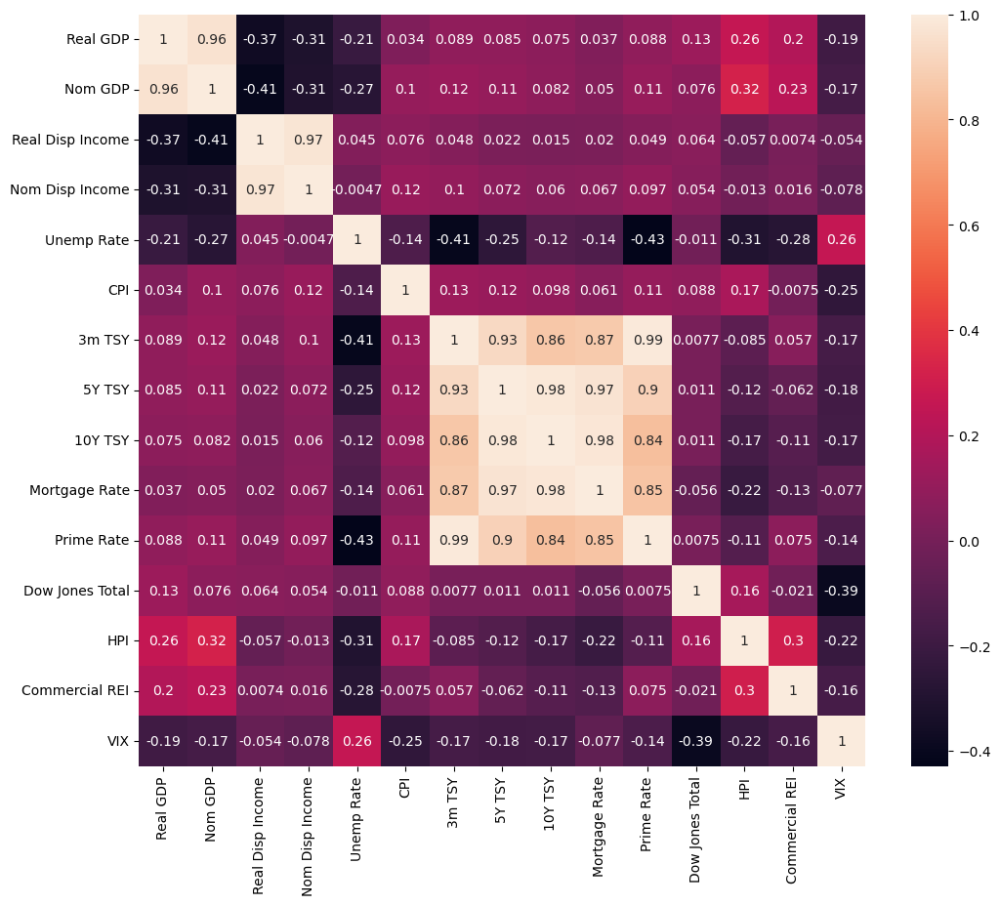

In [35]:
plt.figure(figsize=(12, 10))
sns.heatmap(ccardata_comb.corr(),annot=True)

### Correlation Matrix - Additional Variables

<AxesSubplot:>

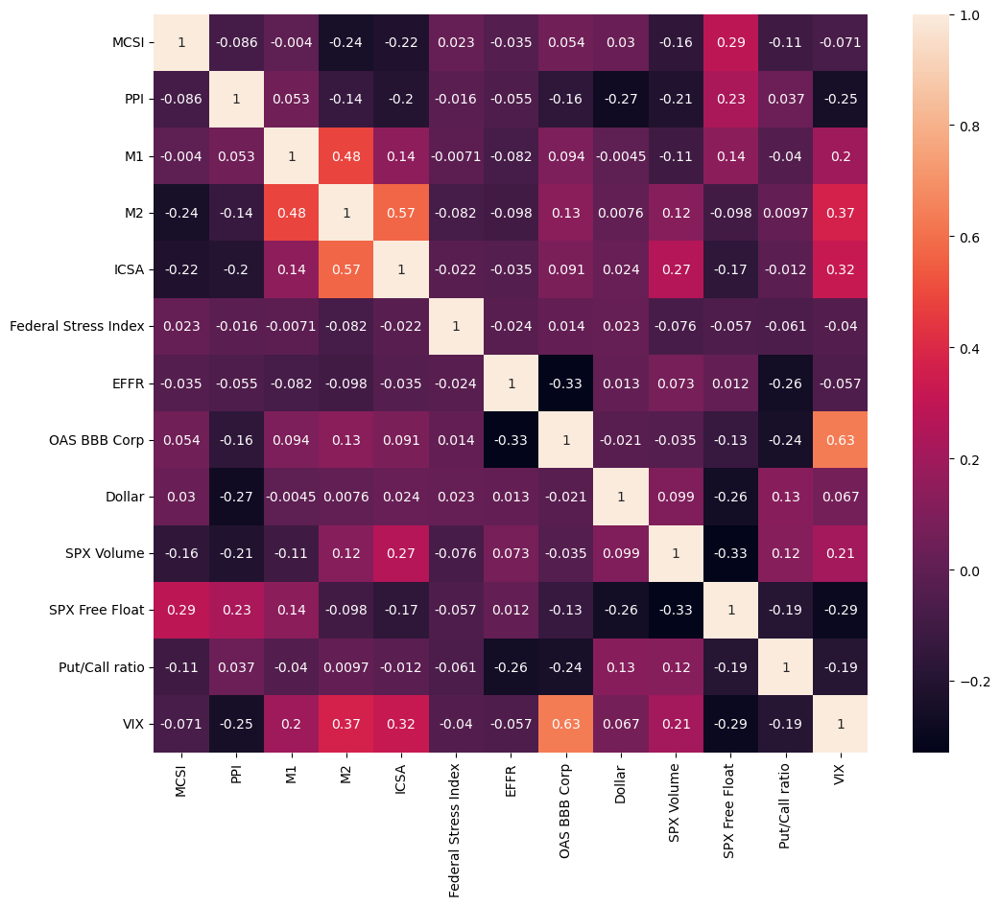

In [36]:
# Additional variable dataset with VIX
add_new = pd.concat([ad_new,VIX_monthly],axis=1).dropna()
plt.figure(figsize=(12, 10))
sns.heatmap(add_new.corr(),annot=True)

### Correlation Matrix - Combined Data

<AxesSubplot:>

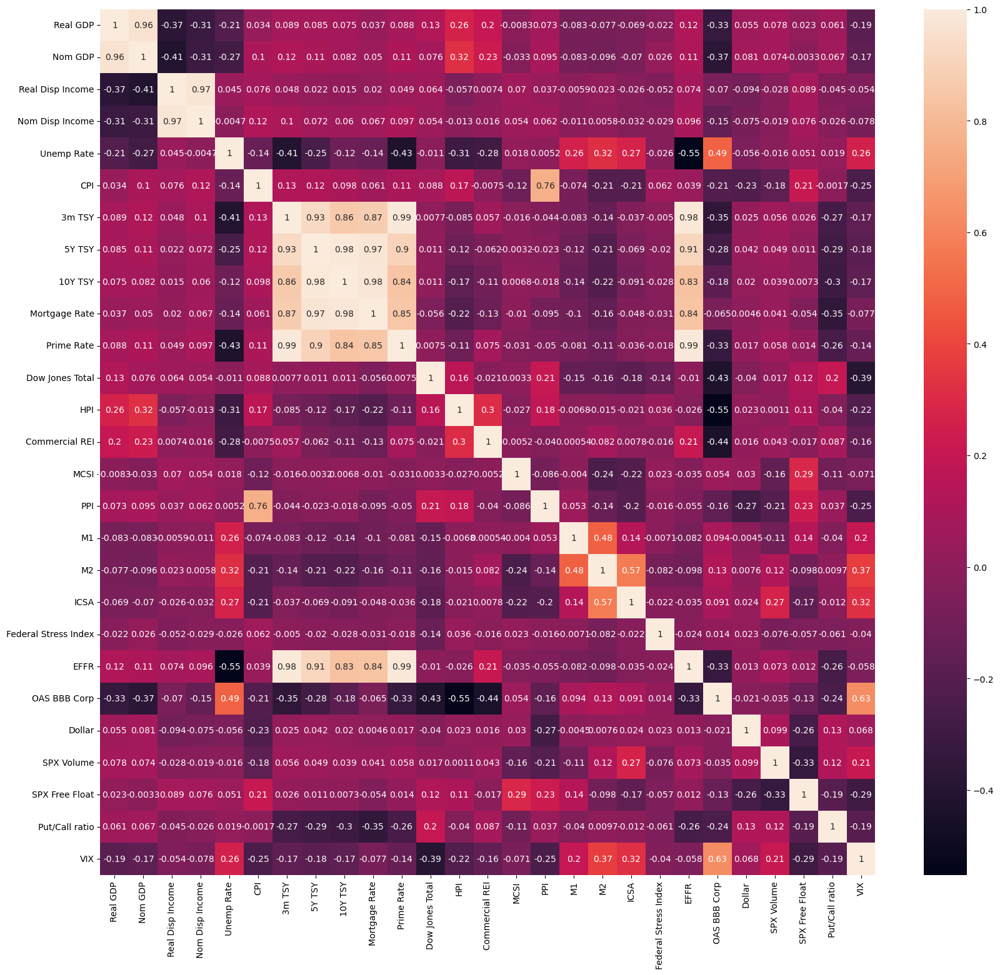

In [37]:
plt.figure(figsize=(20, 18))
sns.heatmap(total_comb_data.corr(),annot=True)

### Pair Plots

In [38]:
# plt.figure()
# sns.pairplot(ccardata_comb)

### Identifying Correlated Variables

In [39]:
correlation_matrix = ccardata_comb.corr()

# Get the variable names with correlation greater than 0.7
variables = correlation_matrix.columns
strong_correlation_variables = []

for var1 in variables:
    for var2 in variables:
        if var1 != var2 and correlation_matrix.loc[var1, var2] >= 0.7:
            strong_correlation_variables.append((var1, var2))

# Print the variable pairs with correlation greater than 0.7
for pair in strong_correlation_variables:
    print(f"{pair[0]} and {pair[1]} have a correlation greater than 0.7.")

Real GDP and Nom GDP have a correlation greater than 0.7.
Nom GDP and Real GDP have a correlation greater than 0.7.
Real Disp Income and Nom Disp Income have a correlation greater than 0.7.
Nom Disp Income and Real Disp Income have a correlation greater than 0.7.
3m TSY and 5Y TSY have a correlation greater than 0.7.
3m TSY and 10Y TSY have a correlation greater than 0.7.
3m TSY and Mortgage Rate have a correlation greater than 0.7.
3m TSY and Prime Rate have a correlation greater than 0.7.
5Y TSY and 3m TSY have a correlation greater than 0.7.
5Y TSY and 10Y TSY have a correlation greater than 0.7.
5Y TSY and Mortgage Rate have a correlation greater than 0.7.
5Y TSY and Prime Rate have a correlation greater than 0.7.
10Y TSY and 3m TSY have a correlation greater than 0.7.
10Y TSY and 5Y TSY have a correlation greater than 0.7.
10Y TSY and Mortgage Rate have a correlation greater than 0.7.
10Y TSY and Prime Rate have a correlation greater than 0.7.
Mortgage Rate and 3m TSY have a corre

### Histogram Plots

In [40]:
# for i in range (len(cols)+1):
#     #plt.subplot(i+1,1,1)
#     plt.figure()
#     #plt.subplot(nrows = 3,ncols =5)
#     sns.histplot(ccardata_comb.iloc[:,i])
#     plt.title(ccardata_comb.columns[i])
#     plt.show()

### Scatter Plots

In [41]:
# for i in range (len(cols)+1):
#     #plt.subplot(i+1,1,1)
#     plt.figure()
#     #plt.subplot(nrows = 3,ncols =5)
#     sns.scatterplot(range(len(ccardata_comb.iloc[:,i])),ccardata_comb.iloc[:,i])
#     plt.title(ccardata_comb.columns[i])
#     plt.show()

### Box Plots

In [42]:
# for i in range (len(cols)+1):
#     #plt.subplot(i+1,1,1)
#     plt.figure()
#     #plt.subplot(nrows = 3,ncols =5)
#     sns.boxplot(y=ccardata_comb.iloc[:,i])
#     plt.title(ccardata_comb.columns[i])
#     plt.show()

# Feature Engineering

### Standard Scaling

In [43]:
# Standard scaling used to capture importance of 

from pandas.core.common import random_state
from sklearn.model_selection import train_test_split
train_x, test_x, train_y,test_y = train_test_split(ccardata_comb.iloc[:,0:14],ccardata_comb.iloc[:,-1],test_size=0.20,shuffle=False)

from sklearn.preprocessing import RobustScaler, StandardScaler
ss = StandardScaler()
ss.fit(train_x)
scaled_t_train = ss.transform(train_x)
scaled_t_test = ss.transform(test_x)
#(pd.DataFrame(scaled_data)).describe()
#np.describe(scaled_data)
(pd.DataFrame(scaled_t_test)).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
count,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000
mean,0.016328,0.483682,0.013787,0.216031,-0.826807,0.330065,-0.676932,-1.073751,-1.400760,-1.385194,-0.717936,0.074063,0.609431,0.169889
std,3.772078,3.847050,4.358012,4.078157,1.328451,1.141544,0.537574,0.479968,0.457402,0.556292,0.505665,1.134669,0.758168,0.735595
min,-13.141409,-13.140973,-8.964460,-7.906216,-1.722897,-3.735845,-1.238793,-1.825357,-2.224925,-2.138210,-1.217546,-2.880656,-0.473390,-0.873623
25%,-0.289619,-0.293020,-1.432254,-0.691437,-1.529322,-0.327306,-1.182881,-1.427016,-1.712963,-1.794873,-1.217546,-0.309798,0.078270,-0.392999
50%,0.068909,0.288678,-0.096354,-0.166850,-1.335748,0.139947,-0.787112,-1.098560,-1.375229,-1.453670,-0.782488,0.226516,0.293210,0.121974
75%,0.456928,1.178460,0.358421,0.350925,-0.803417,0.865626,-0.349683,-0.700220,-1.032134,-1.125263,-0.430091,0.720771,1.283661,0.711754
max,13.341879,13.150458,14.115355,14.821360,5.568422,3.741595,0.809121,-0.003707,-0.423676,0.259815,0.770668,2.391695,2.112909,1.993321


### PCA - Scaled Data

In [44]:
from sklearn.decomposition import PCA
pca = PCA(0.95)
model = pca.fit(scaled_t_train)
pca_train = model.transform(scaled_t_train)
pca_test = model.transform(scaled_t_test)
n_comp = model.components_.shape[0]
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_comp)]
initial_feature_names = ['Real GDP', 'Nom GDP', 'Real Disp Income', 'Nom Disp Income',
       'Unemp Rate', 'CPI', '3m TSY', '5Y TSY', '10Y TSY', 'Mortgage Rate',
       'Prime Rate', 'Dow Jones Total', 'HPI', 'Commercial REI']
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_comp)]
dic = {'PC{}'.format(i+1): most_important_names[i] for i in range(n_comp)}
df = pd.DataFrame(sorted(dic.items()))
pca_train[:,0]

array([-3.95353144e+00, -4.15476336e+00, -4.88583539e+00, -4.85632170e+00,
       -5.00099850e+00, -4.15831107e+00, -4.31289181e+00, -4.24922275e+00,
       -3.54418705e+00, -3.15064174e+00, -2.99140277e+00, -1.87712384e+00,
       -1.48342694e+00, -1.45381625e+00, -2.16073276e+00, -2.07780947e+00,
       -2.14696544e+00, -2.99188176e+00, -2.82292961e+00, -2.57598702e+00,
       -2.00727620e+00, -1.88636089e+00, -1.44434894e+00, -1.13371561e+00,
       -1.30003744e+00, -1.57890290e+00, -2.35611206e+00, -2.24888718e+00,
       -2.14822212e+00, -1.38369231e+00, -1.17365750e+00, -1.02645765e+00,
       -9.30458166e-01, -1.07256461e+00, -1.05962980e+00, -1.18888575e+00,
       -9.58223799e-01, -7.79307029e-01, -1.11999911e-01, -1.18976861e-01,
       -4.88149211e-02, -2.96384641e-01, -2.56889317e-01, -8.96454002e-02,
        1.03202195e-03, -1.11895960e-01, -1.86633293e-01, -8.85400499e-01,
       -1.13174826e+00, -1.42619854e+00, -1.39142744e+00, -1.90323714e+00,
       -2.00681021e+00, -

In [45]:
model.components_

array([[-0.18564147, -0.23730262, -0.12929745, -0.19480209,  0.25697   ,
        -0.11642168, -0.40177173, -0.39800371, -0.37995669, -0.37709551,
        -0.39451241, -0.0468155 , -0.07339696, -0.07319153],
       [-0.44394576, -0.40170608, -0.27398146, -0.26620374,  0.14243264,
         0.02587558,  0.13925786,  0.19004948,  0.21867771,  0.24162472,
         0.13616832, -0.14573351, -0.3912319 , -0.34655599],
       [ 0.24943023,  0.24694859, -0.61049601, -0.54605755, -0.0053973 ,
        -0.11726679,  0.03020795,  0.04078709,  0.04311723,  0.01624214,
         0.02596482,  0.39092879,  0.18418382, -0.00373121],
       [ 0.19072528,  0.12457456,  0.16382626,  0.19152482,  0.45759731,
         0.36032871, -0.0999011 ,  0.03298082,  0.10057341,  0.04563456,
        -0.13636855,  0.49333799, -0.12802006, -0.49367884],
       [ 0.17918488,  0.17691068,  0.08299979,  0.15009096,  0.22138455,
        -0.84614375, -0.02943779,  0.04989846,  0.08569056,  0.10553772,
        -0.02569665,  0.00

In [46]:
df

,0,1
0,PC1,3m TSY
1,PC2,Real GDP
2,PC3,Real Disp Income
3,PC4,Commercial REI
4,PC5,CPI
5,PC6,Dow Jones Total
6,PC7,HPI
7,PC8,Unemp Rate


### Time Series Analysis


#### Stationarity Check for CCAR Data

In [47]:
for i in range(len(cols)+1):
    print('\n\n', ccardata_comb.columns[i], ':')
    adfcnt = 0
    adf = adfuller(ccardata_comb.iloc[:,i])
    if adf[1] < 0.05:
        adfcnt = 1
        # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], adf[0:2])
    # else:
    # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    kpcnt = 0
    kpstest = kpss(ccardata_comb.iloc[:,i])
    if kpstest[1] > 0.05:
        kpcnt = 1
        # print('KPSS test of Stationarity', ccardata_comb.columns[i], kpstest[0:2])
    # else:
    # print('KPSS test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    # ('Compared ADF and KPSS Tests')
    if adfcnt == 1 and kpcnt == 0:
        print('is difference stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 1:
        print('is trend stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 0:
        print('is not stationary by ADF and KPSS test')
    else:
        print('is stationary by ADF and KPSS test')
        
    ppcnt = 0
    pptest = PhillipsPerron(ccardata_comb.iloc[:,i])
    if pptest.pvalue< 0.05:
        print('Is stationary by Phillips Perron test')
        # print(pptest.stat, pptest.pvalue)
        ppcnt = 1
    else:
        print('Is NOT stationary by Phillips Perron test')



 Real GDP :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Nom GDP :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Real Disp Income :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Nom Disp Income :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Unemp Rate :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 CPI :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 3m TSY :
is not stationary by ADF and KPSS test
Is NOT stationary by Phillips Perron test


 5Y TSY :
is not stationary by ADF and KPSS test
Is NOT stationary by Phillips Perron test


 10Y TSY :
is not stationary by ADF and KPSS test
Is NOT stationary by Phillips Perron test


 Mortgage Rate :
is not stationary by ADF and KPSS test
Is NOT stationary by Phillips Perron test


 Prime Rate :
is difference stationary by comparison of ADF and KPSS test
Is NOT stat

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great

#### Stationarity Check for Additional Data

In [48]:
for i in range(len(add_new.columns)):
    print('\n\n', add_new.columns[i], ':')
    adfcnt = 0
    adf = adfuller(add_new.iloc[:,i])
    if adf[1] < 0.05:
        adfcnt = 1
        # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], adf[0:2])
    # else:
    # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    kpcnt = 0
    kpstest = kpss(add_new.iloc[:,i])
    if kpstest[1] > 0.05:
        kpcnt = 1
        # print('KPSS test of Stationarity', ccardata_comb.columns[i], kpstest[0:2])
    # else:
    # print('KPSS test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    # ('Compared ADF and KPSS Tests')
    if adfcnt == 1 and kpcnt == 0:
        print('is difference stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 1:
        print('is trend stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 0:
        print('is not stationary by ADF and KPSS test')
    else:
        print('is stationary by ADF and KPSS test')
        
    ppcnt = 0
    pptest = PhillipsPerron(add_new.iloc[:,i])
    if pptest.pvalue< 0.05:
        print('Is stationary by Phillips Perron test')
        # print(pptest.stat, pptest.pvalue)
        ppcnt = 1
    else:
        print('Is NOT stationary by Phillips Perron test')

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great



 MCSI :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 PPI :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 M1 :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 M2 :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 ICSA :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Federal Stress Index :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 EFFR :
is difference stationary by comparison of ADF and KPSS test
Is NOT stationary by Phillips Perron test


 OAS BBB Corp :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Dollar :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 SPX Volume :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 SPX Free Float :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Put/Call ratio :
i

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great

### Converting CCAR data to Stationary Data

In [49]:
# Taking difference stationary
tsy_3m_monthly_diff = pd.DataFrame(fred_1['3m TSY'].diff())
tsy_5y_monthly_diff = pd.DataFrame(fred_1['5Y TSY'].diff())
tsy_10y_monthly_diff = pd.DataFrame(fred_1['10Y TSY'].diff())
prime_rate_monthly_diff = pd.DataFrame(fred_1['Prime Rate'].diff())
mortgage_monthly_diff = mortgage_monthly.diff()



# Combining into single dataframe
cols_1 = [real_gdp_monthly_growth,nom_gdp_monthly_growth,real_disp_inc_monthly,nom_disp_inc_monthly,unemp_rate_monthly,CPI_monthly_pct,tsy_3m_monthly_diff,tsy_5y_monthly_diff,tsy_10y_monthly_diff,mortgage_monthly_diff,prime_rate_monthly_diff,Dow_jones_qtr_pct_1,HPI_qtr_pct2,REI_qtr_pct2]
combined_data_stationary = pd.concat(cols_1,axis = 1)
combined_data_stationary2 = combined_data_stationary.drop(combined_data_stationary.index[:3])
ccar_new_stat = combined_data_stationary2.drop(combined_data_stationary.index[-2:])
missing_value_column_stat = ['Dow Jones Total', 'HPI', 'Commercial REI']
ccardata_stationary = pd.concat([ccar_new_stat,VIX_monthly],axis=1)
ccardata_stationary = ccardata_stationary.dropna()
ccardata_stationary.head(10)


,Real GDP,Nom GDP,Real Disp Income,Nom Disp Income,Unemp Rate,CPI,3m TSY,5Y TSY,10Y TSY,Mortgage Rate,Prime Rate,Dow Jones Total,HPI,Commercial REI,VIX
1990-02-01,0.263512,1.231059,1.133333,2.233333,5.3,0.392157,0.10,0.30,0.26,0.1510,-0.11,-0.065953,0.476171,0.122040,27.250000
1990-03-01,0.263512,1.231059,1.133333,2.233333,5.2,0.468750,0.16,0.18,0.12,0.3025,0.00,-0.065953,0.476171,0.122040,24.870001
1990-04-01,1.481119,3.007416,1.033333,3.066667,5.4,0.233281,-0.13,0.17,0.20,0.0705,0.00,-1.427146,0.365090,-0.294387,22.740000
1990-05-01,1.481119,3.007416,1.033333,3.066667,5.4,0.155159,-0.03,-0.03,-0.03,0.1020,0.00,-1.427146,0.365090,-0.294387,24.160000
1990-06-01,1.481119,3.007416,1.033333,3.066667,5.2,0.619675,-0.01,-0.31,-0.28,0.1075,0.00,-1.427146,0.365090,-0.294387,20.139999
1990-07-01,0.486523,2.027329,0.933333,2.200000,5.5,0.461894,-0.11,-0.10,-0.01,-0.3135,0.00,1.536702,0.082595,-0.294550,19.360001
1990-08-01,0.486523,2.027329,0.933333,2.200000,5.7,0.842912,-0.17,0.11,0.28,-0.1290,0.00,1.536702,0.082595,-0.294550,23.680000
1990-09-01,0.486523,2.027329,0.933333,2.200000,5.9,0.683891,-0.09,0.07,0.14,0.0650,0.00,1.536702,0.082595,-0.294550,36.470001
1990-10-01,0.088772,1.249580,-0.033333,1.666667,5.9,0.679245,-0.19,-0.18,-0.17,0.0750,0.00,-5.305404,-0.097730,-0.137110,30.559999
1990-11-01,0.088772,1.249580,-0.033333,1.666667,6.2,0.224888,-0.11,-0.31,-0.33,0.0025,0.00,-5.305404,-0.097730,-0.137110,33.980000


### Re-checking CCAR data for Stationarity

In [50]:
for i in range(len(cols)):
    adf = adfuller(ccardata_stationary.iloc[:,i])
    if adf[1] < 0.05:
        print('ADFuller Test of Stationarity', ccardata_stationary.columns[i], adf[0:2])
    else:
        print('ADFuller Test of Stationarity', ccardata_stationary.columns[i], 'is not stationary')

ADFuller Test of Stationarity Real GDP (-4.713019718889571, 7.953917709682792e-05)
ADFuller Test of Stationarity Nom GDP (-3.8943968415318673, 0.0020764724313920542)
ADFuller Test of Stationarity Real Disp Income (-5.7857379423154285, 5.004541995708551e-07)
ADFuller Test of Stationarity Nom Disp Income (-4.797245601115209, 5.5049626935903177e-05)
ADFuller Test of Stationarity Unemp Rate (-3.1709384348436025, 0.02172971733978445)
ADFuller Test of Stationarity CPI (-5.214031202180404, 8.230315768403572e-06)
ADFuller Test of Stationarity 3m TSY (-3.8677522718156454, 0.0022854158524096536)
ADFuller Test of Stationarity 5Y TSY (-14.155929315524354, 2.121722122360152e-26)
ADFuller Test of Stationarity 10Y TSY (-10.37035377644134, 2.2726061069322446e-18)
ADFuller Test of Stationarity Mortgage Rate (-9.970929563116387, 2.2415124426234965e-17)
ADFuller Test of Stationarity Prime Rate (-4.182350803799591, 0.0007057222846241777)
ADFuller Test of Stationarity Dow Jones Total (-4.084727228584116, 0

In [51]:
for i in range(len(cols)):
    pptest = PhillipsPerron(ccardata_stationary.iloc[:,i])
    if pptest.pvalue < 0.05:
        print('PhillipsPerron Test of Stationarity', ccardata_stationary.columns[i], pptest.pvalue)
    else:
        print('PhillipsPerron Test of Stationarity', ccardata_stationary.columns[i], 'is not stationary')

PhillipsPerron Test of Stationarity Real GDP 4.6000870143692296e-14
PhillipsPerron Test of Stationarity Nom GDP 1.3059049920697578e-14
PhillipsPerron Test of Stationarity Real Disp Income 2.0555093315213402e-15
PhillipsPerron Test of Stationarity Nom Disp Income 1.829291054914718e-15
PhillipsPerron Test of Stationarity Unemp Rate 0.024388123893239747
PhillipsPerron Test of Stationarity CPI 7.215014664642618e-23
PhillipsPerron Test of Stationarity 3m TSY 2.737625004273823e-26
PhillipsPerron Test of Stationarity 5Y TSY 3.9498425863867737e-26
PhillipsPerron Test of Stationarity 10Y TSY 5.175753727346131e-27
PhillipsPerron Test of Stationarity Mortgage Rate 1.8469781518455187e-25
PhillipsPerron Test of Stationarity Prime Rate 9.3768091529044e-20
PhillipsPerron Test of Stationarity Dow Jones Total 1.7443712203596493e-12
PhillipsPerron Test of Stationarity HPI is not stationary
PhillipsPerron Test of Stationarity Commercial REI 7.626042898962066e-10


In [52]:
for i in range(len(cols)):
    kptest = kpss(ccardata_stationary.iloc[:,i])
    if kptest[1] > 0.05:
        print('KPSS Test of Stationarity', ccardata_stationary.columns[i], kptest[0:2])
    else:
        print('KPSS Test of Stationarity', ccardata_stationary.columns[i], 'is not stationary')

KPSS Test of Stationarity Real GDP (0.1885879754446285, 0.1)
KPSS Test of Stationarity Nom GDP (0.18841121434463848, 0.1)
KPSS Test of Stationarity Real Disp Income (0.06160438599104815, 0.1)
KPSS Test of Stationarity Nom Disp Income (0.11350263075289291, 0.1)
KPSS Test of Stationarity Unemp Rate (0.2144689406962423, 0.1)
KPSS Test of Stationarity CPI (0.2036467018784594, 0.1)
KPSS Test of Stationarity 3m TSY (0.2540083421106051, 0.1)
KPSS Test of Stationarity 5Y TSY (0.18803042418741306, 0.1)
KPSS Test of Stationarity 10Y TSY (0.1364168754867697, 0.1)
KPSS Test of Stationarity Mortgage Rate (0.22256724874457567, 0.1)
KPSS Test of Stationarity Prime Rate (0.20266792324716912, 0.1)
KPSS Test of Stationarity Dow Jones Total (0.06024320864012278, 0.1)
KPSS Test of Stationarity HPI (0.23248001060990361, 0.1)
KPSS Test of Stationarity Commercial REI (0.1725129931741956, 0.1)


C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great

### Converting Additional Variable data to stationary data

In [53]:
EFFR_monthly_diff = EFFR_monthly.diff().dropna()
put_call_ratio_monthly_diff = put_call_ratio_monthly.diff().dropna()

In [54]:
# Combining additional variables into single dataframe
adcols1 = [mcsi_monthly_pct,ppi_monthly_pct,m1_monthly_pct,m2_monthly_pct,ICSA_monthly_pct,FSI_monthly_pct,EFFR_monthly_diff,OAS_BBBcorp_monthly, dollar_monthly_pct,SPX_index_vols_monthly_pct,SPX_index_mkt_cap_monthly_pct,put_call_ratio_monthly_diff,VIX_monthly]
adcomb_dta_1 = pd.concat(adcols1,axis = 1)
adcomb_dta_2 = adcomb_dta_1.drop(adcomb_dta_1.index[:3])
ad_new_stationary = adcomb_dta_2.drop(adcomb_dta_1.index[-2:])
ad_new_stationary = ad_new_stationary.dropna()

### Rechecking Additional Variable data for stationarity

In [55]:
for i in range(len(ad_new_stationary.columns)):
    print('\n\n', ad_new_stationary.columns[i], ':')
    adfcnt = 0
    adf = adfuller(ad_new_stationary.iloc[:,i])
    if adf[1] < 0.05:
        adfcnt = 1
        # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], adf[0:2])
    # else:
    # print('ADFuller Test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    kpcnt = 0
    kpstest = kpss(ad_new_stationary.iloc[:,i])
    if kpstest[1] > 0.05:
        kpcnt = 1
        # print('KPSS test of Stationarity', ccardata_comb.columns[i], kpstest[0:2])
    # else:
    # print('KPSS test of Stationarity', ccardata_comb.columns[i], 'is not stationary')
    
    # ('Compared ADF and KPSS Tests')
    if adfcnt == 1 and kpcnt == 0:
        print('is difference stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 1:
        print('is trend stationary by comparison of ADF and KPSS test')
    elif adfcnt == 0 and kpcnt == 0:
        print('is not stationary by ADF and KPSS test')
    else:
        print('is stationary by ADF and KPSS test')
        
    ppcnt = 0
    pptest = PhillipsPerron(ad_new_stationary.iloc[:,i])
    if pptest.pvalue< 0.05:
        print('Is stationary by Phillips Perron test')
        # print(pptest.stat, pptest.pvalue)
        ppcnt = 1
    else:
        print('Is NOT stationary by Phillips Perron test')



 MCSI :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 PPI :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 M1 :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 M2 :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 ICSA :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Federal Stress Index :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 EFFR :
is trend stationary by comparison of ADF and KPSS test
Is stationary by Phillips Perron test


 OAS BBB Corp :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Dollar :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 SPX Volume :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 SPX Free Float :
is stationary by ADF and KPSS test
Is stationary by Phillips Perron test


 Put/Call ratio :
is station

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great

### Correlation Matrix - Stationary Data

<AxesSubplot:>

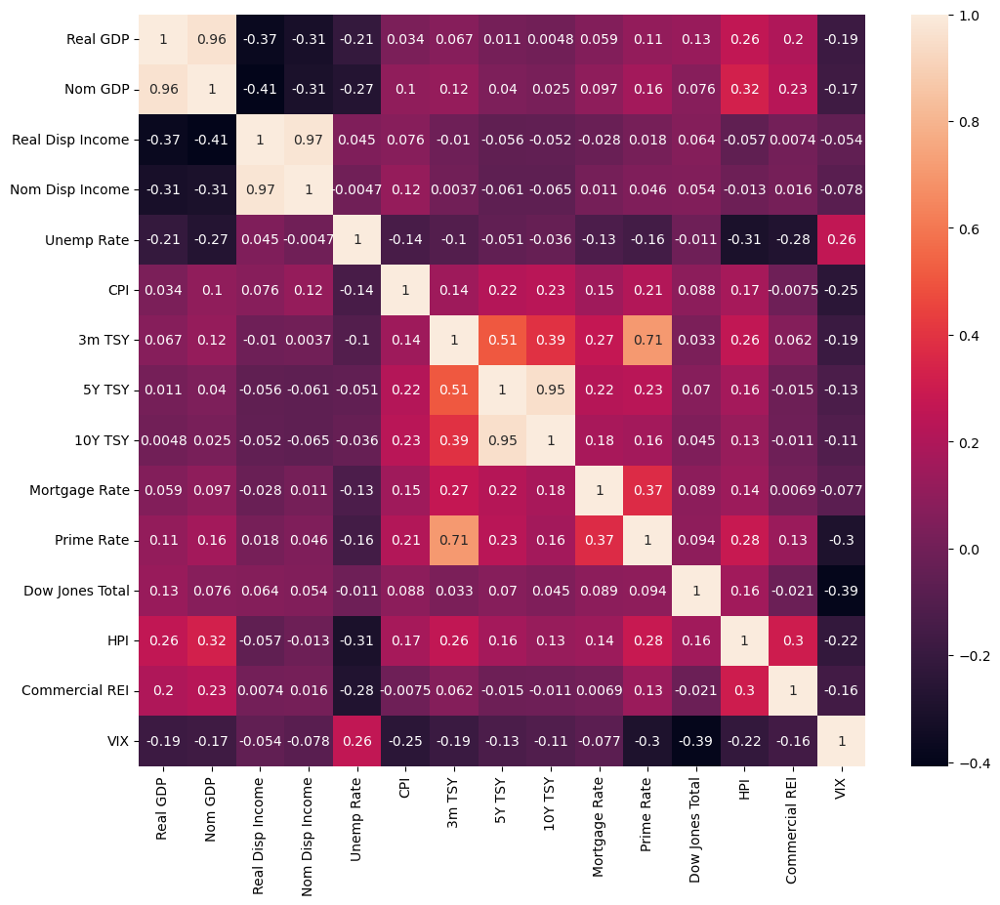

In [56]:
plt.figure(figsize=(12, 10))
sns.heatmap(ccardata_stationary.corr(),annot=True)

### Stationary additional variable data correlation

<AxesSubplot:>

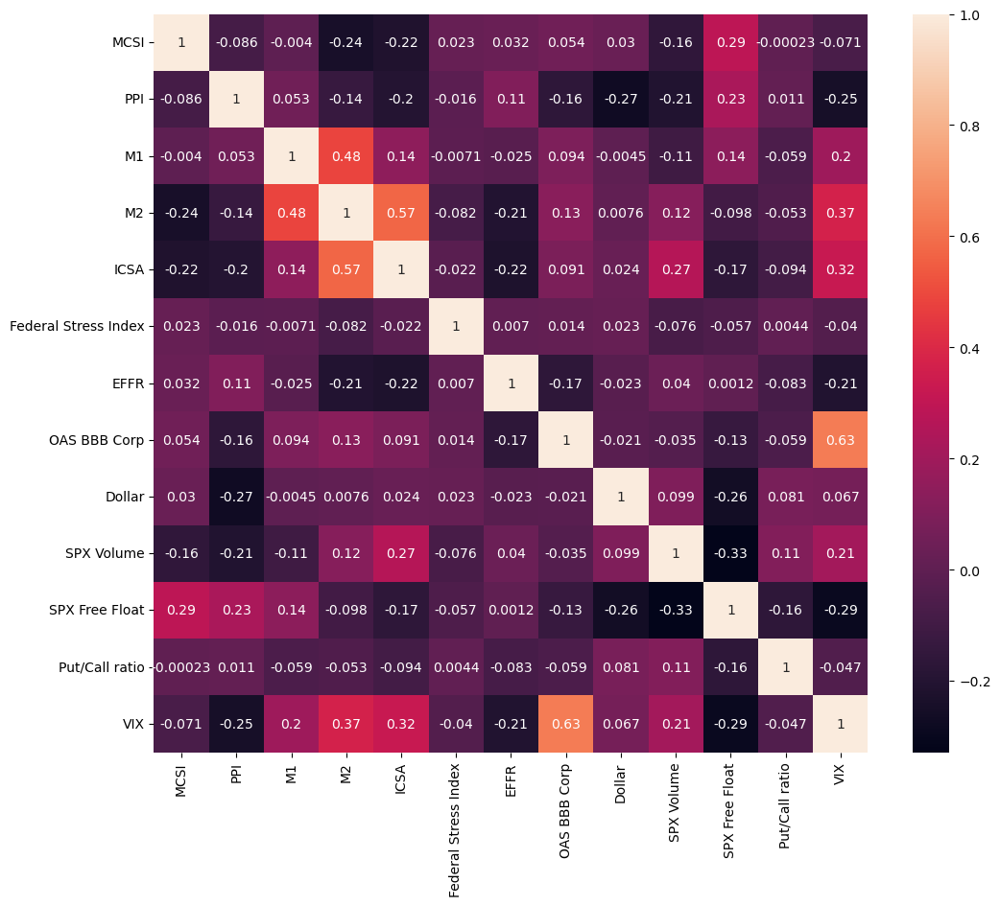

In [57]:
plt.figure(figsize=(12, 10))
sns.heatmap(ad_new_stationary.corr(),annot=True)

### Seasonality Check - CCAR Data

In [58]:
import statsmodels.api as sm

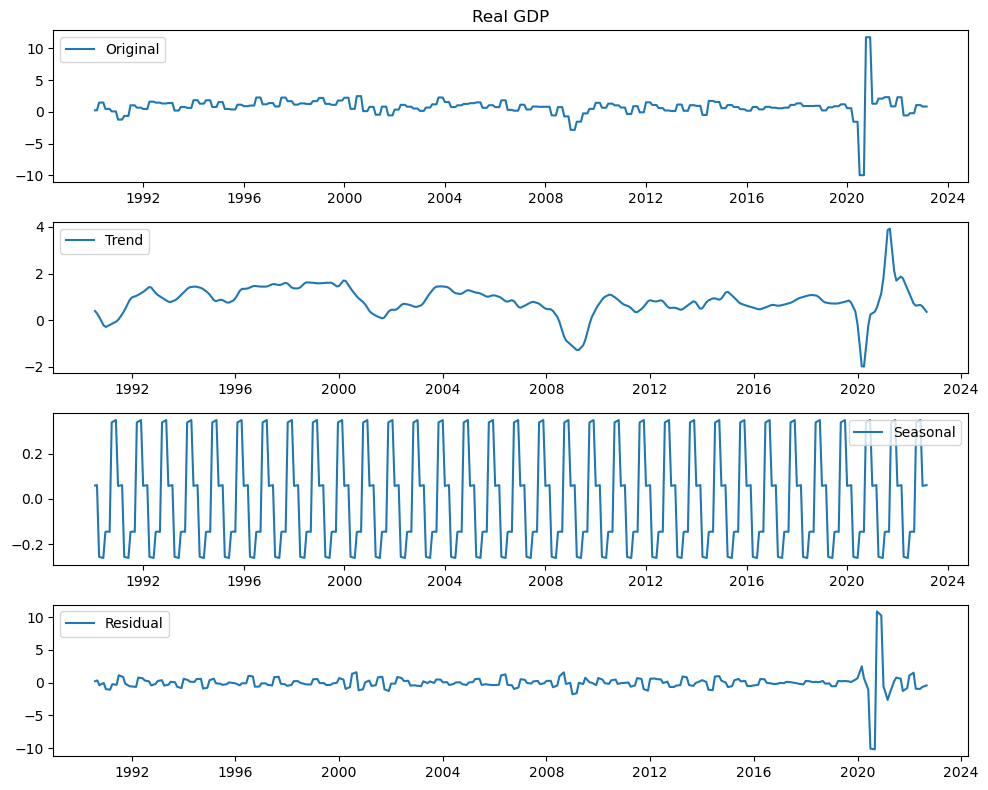

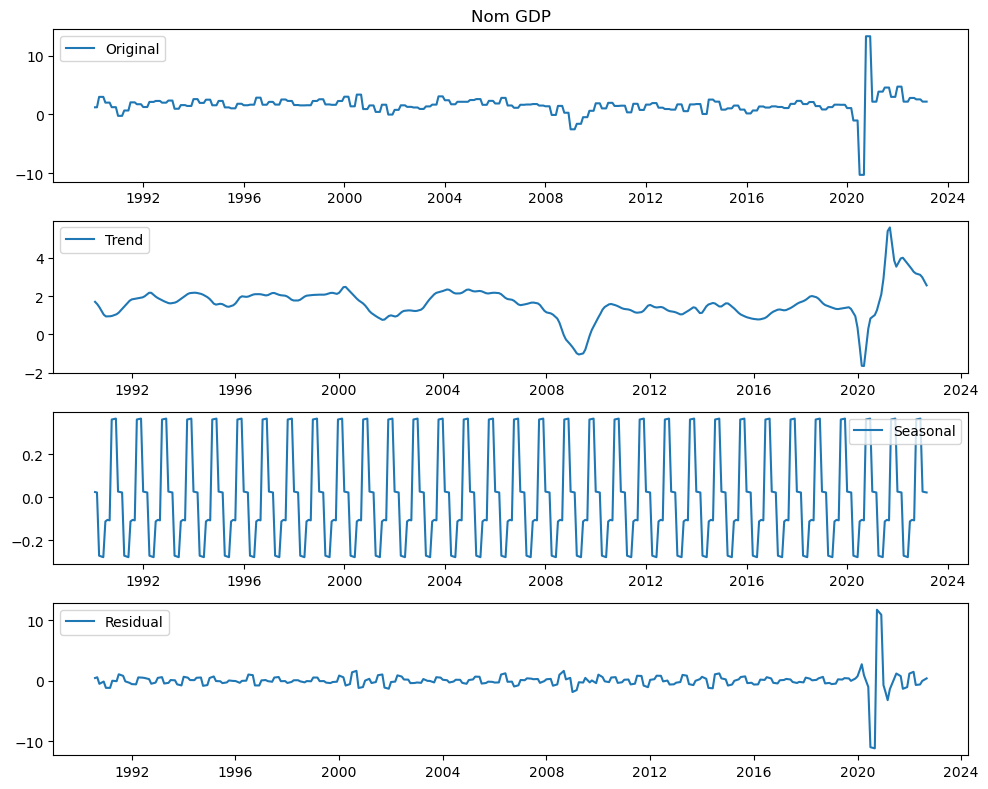

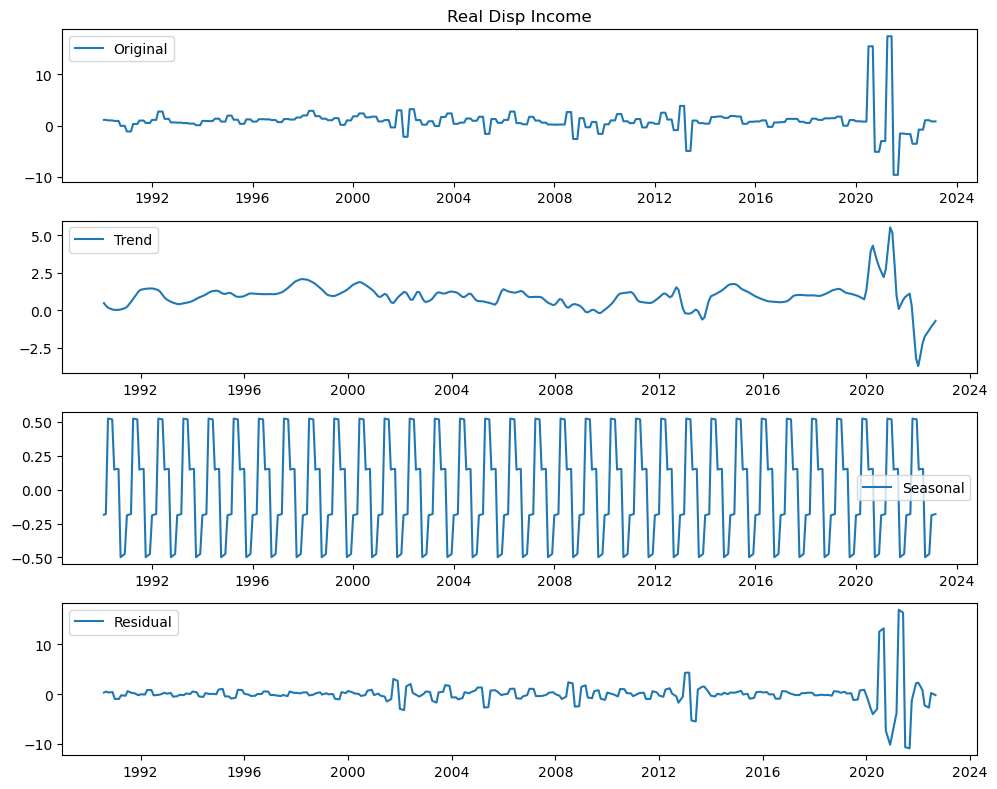

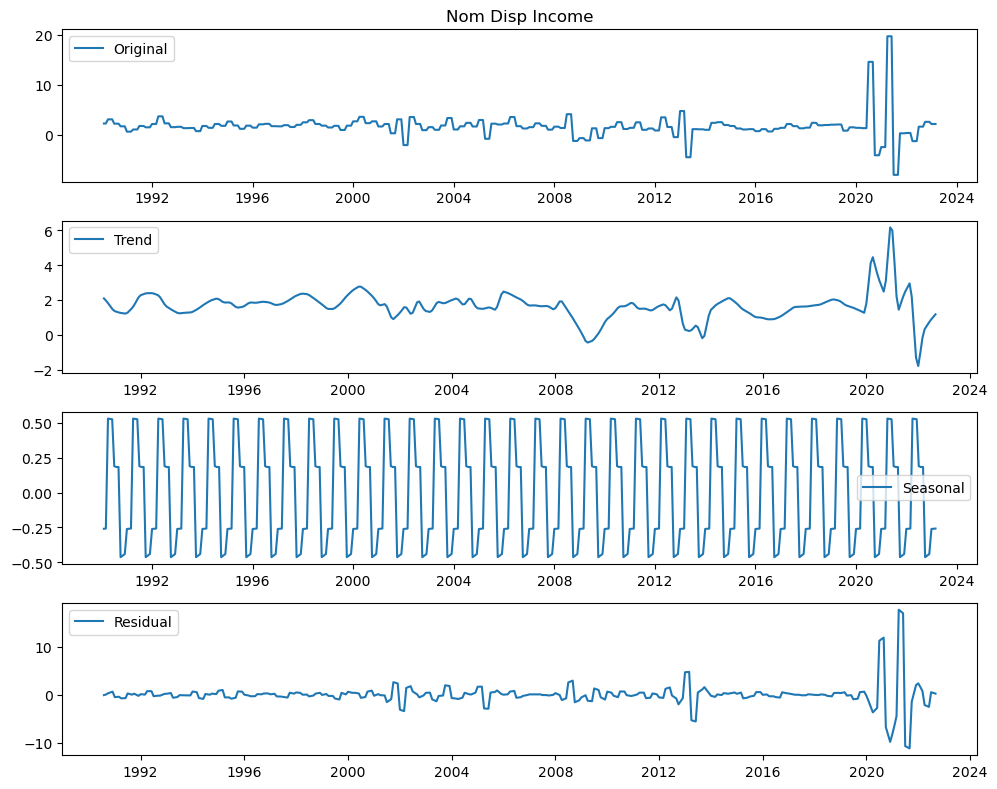

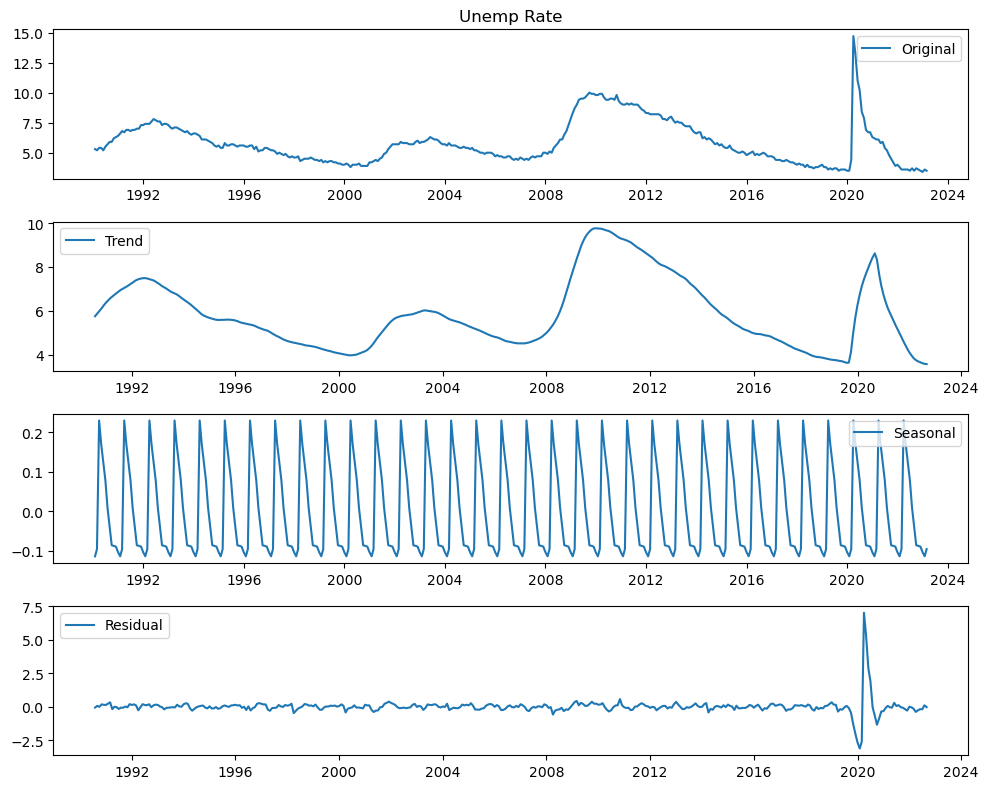

...

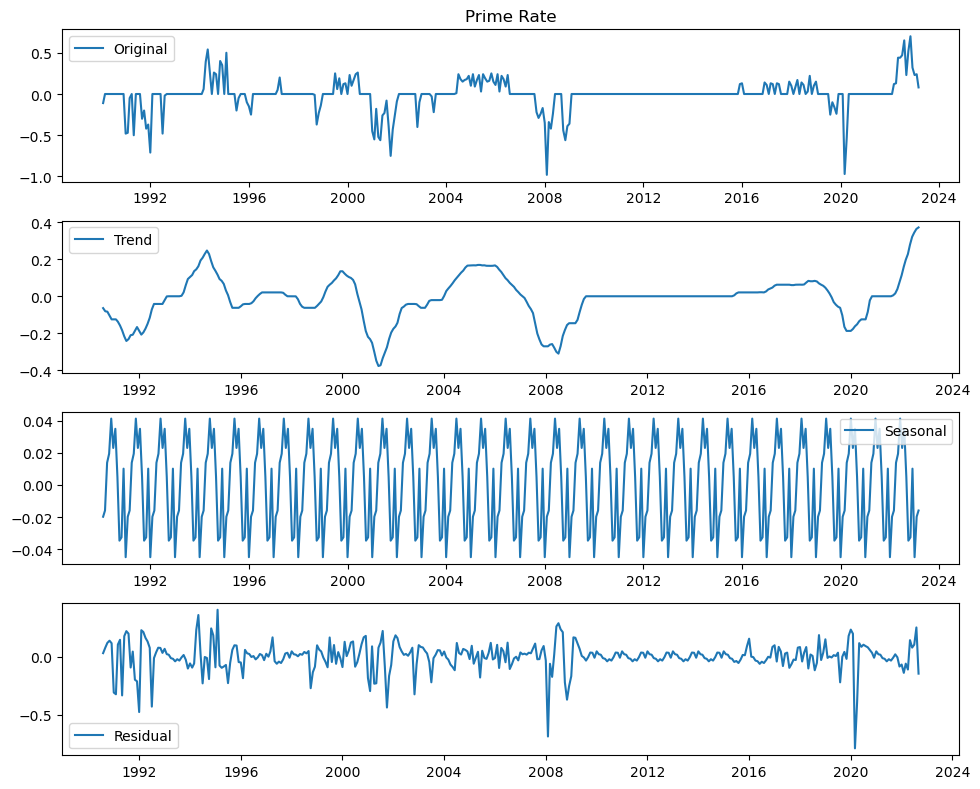

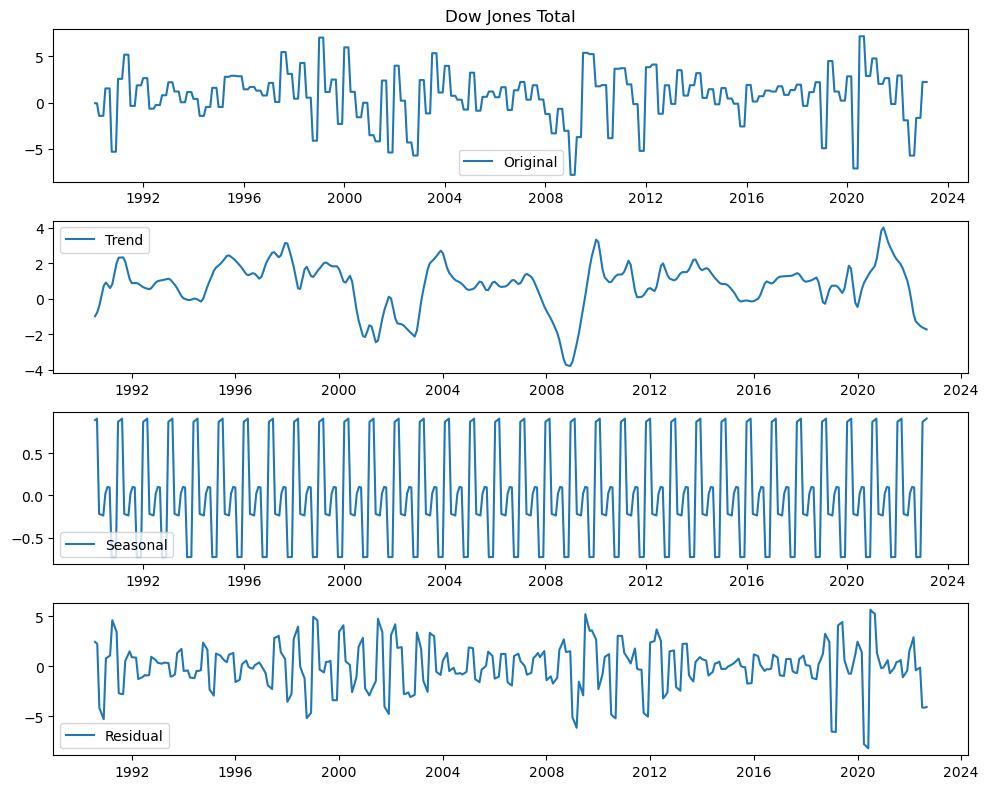

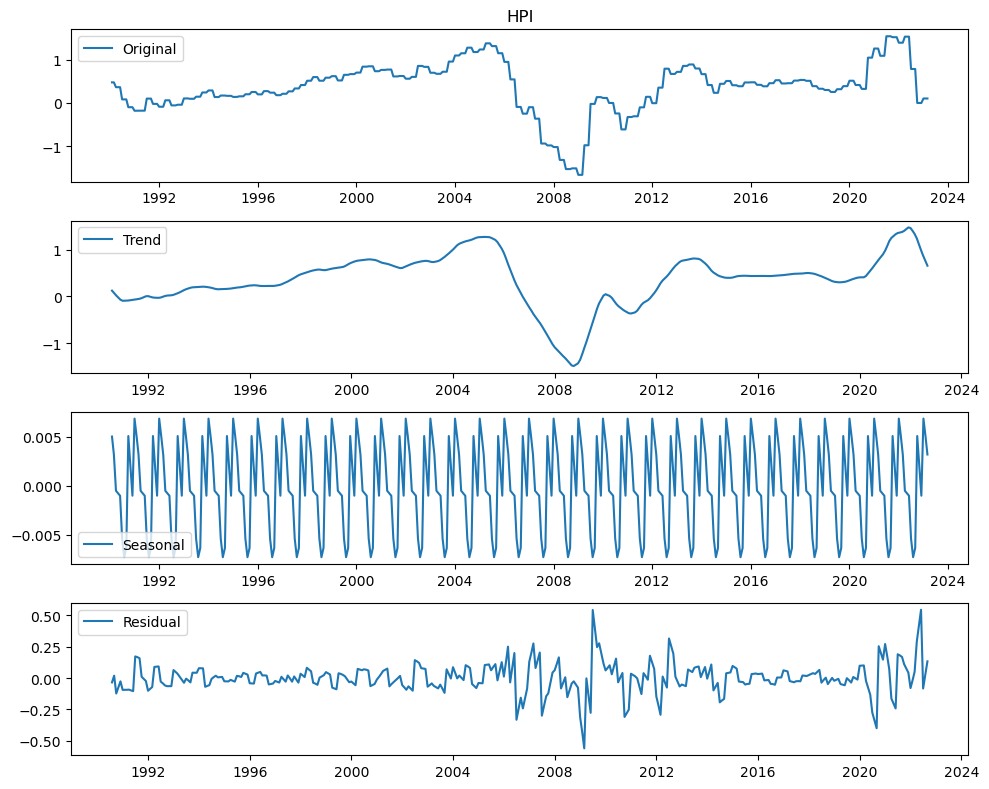

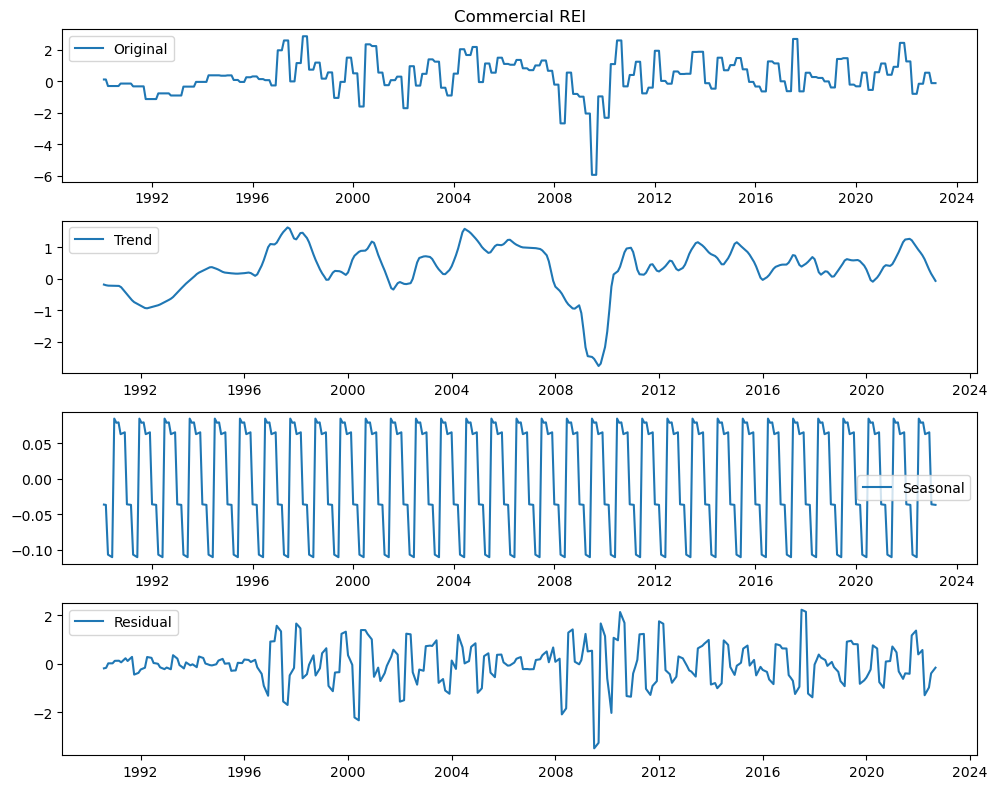

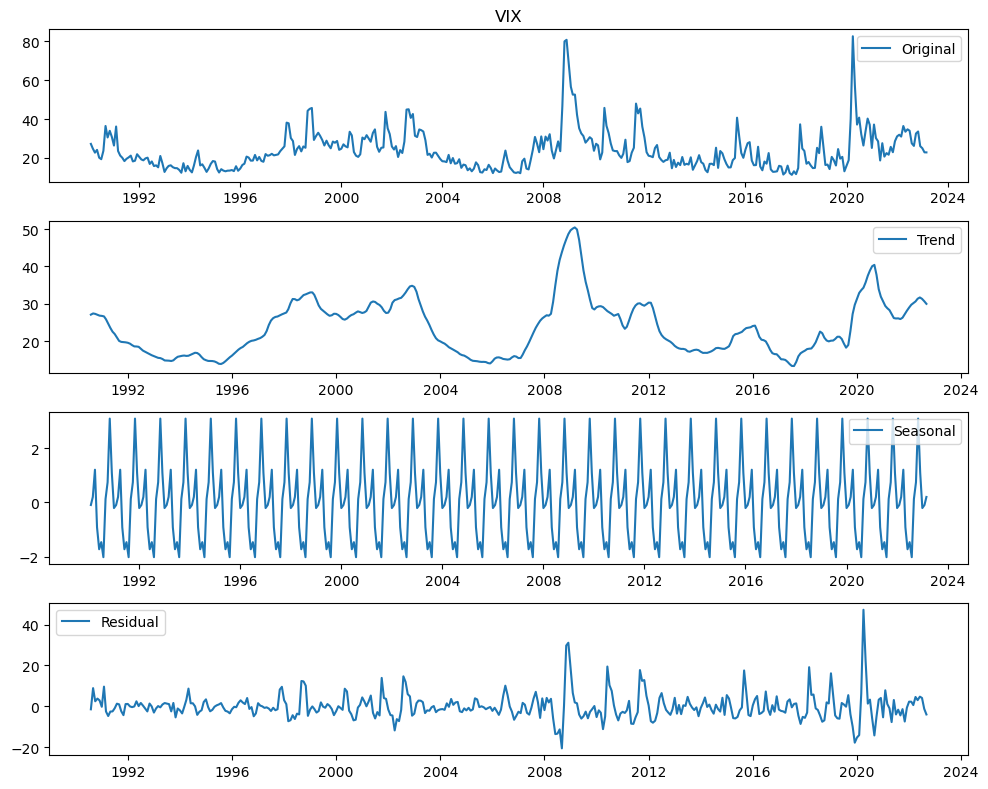

In [59]:
seasonalty_check(ccardata_stationary,'additive')

### Seasonality Removal - CCAR Data

In [60]:
def seasonality_removal(S,model_type):
    ccardata_stat_seas = pd.DataFrame(index=S.index, columns=S.columns)
    for column in S.columns:
        seasonal_decomposition = sm.tsa.seasonal_decompose(S[column], model=model_type)
        deseasonalized = S[column] - seasonal_decomposition.seasonal
        ccardata_stat_seas.loc[:, column] = deseasonalized
    return ccardata_stat_seas

In [61]:
ccar_data_stat_seas = seasonality_removal(ccardata_stationary,'additive')

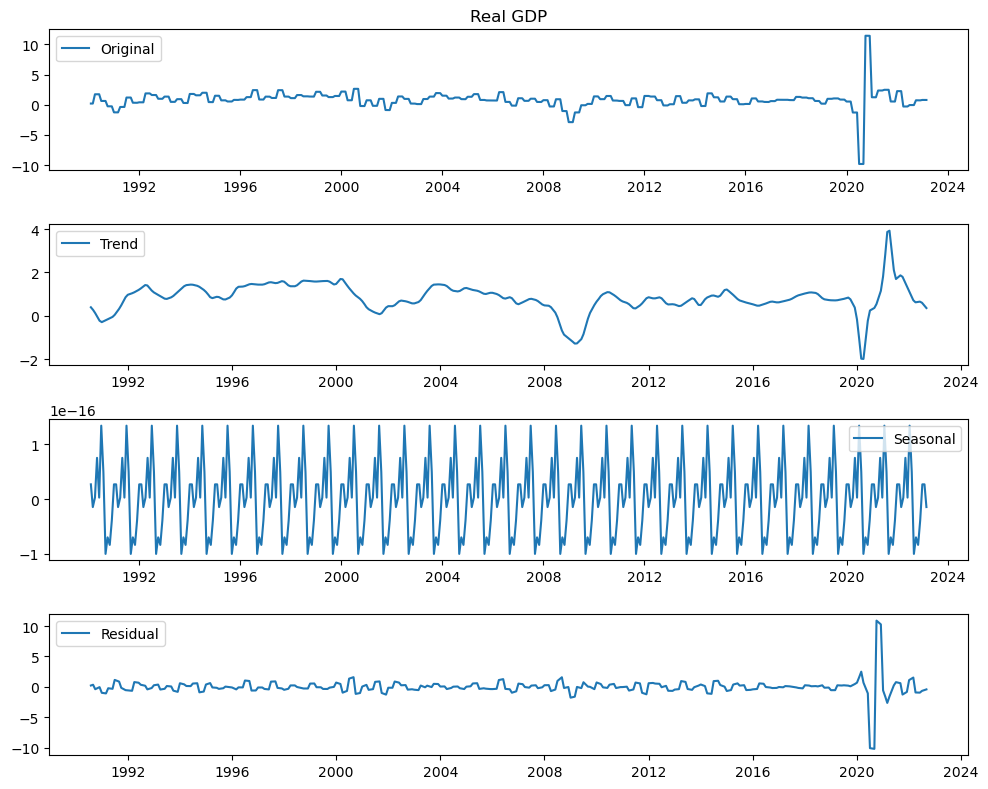

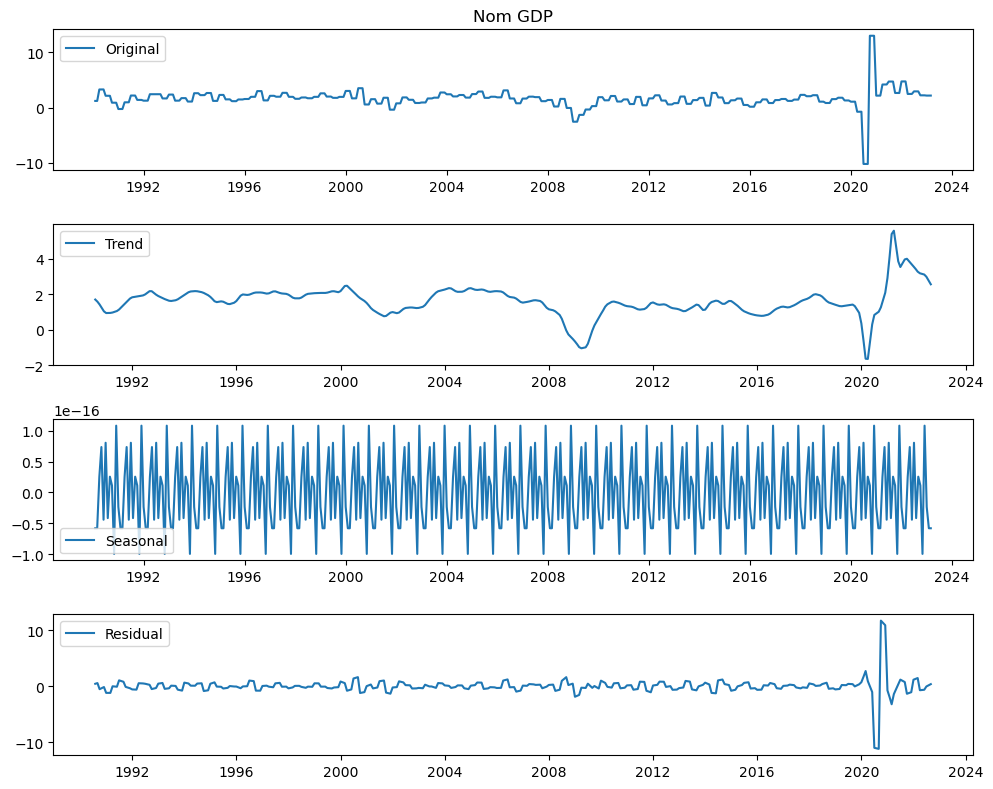

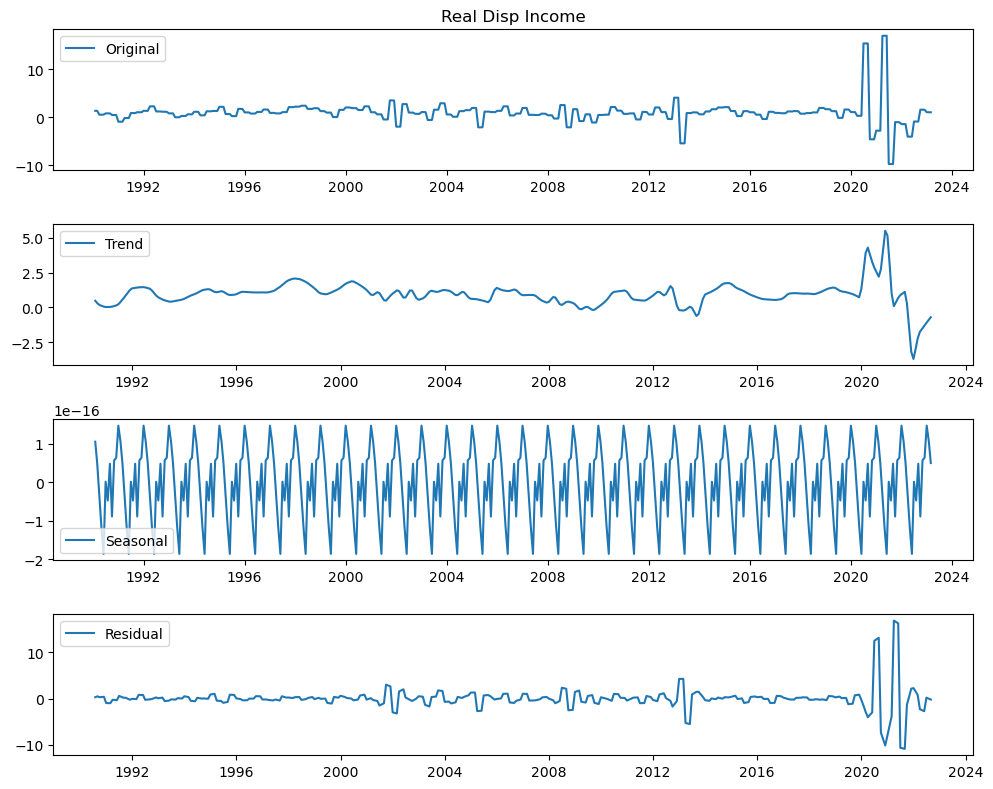

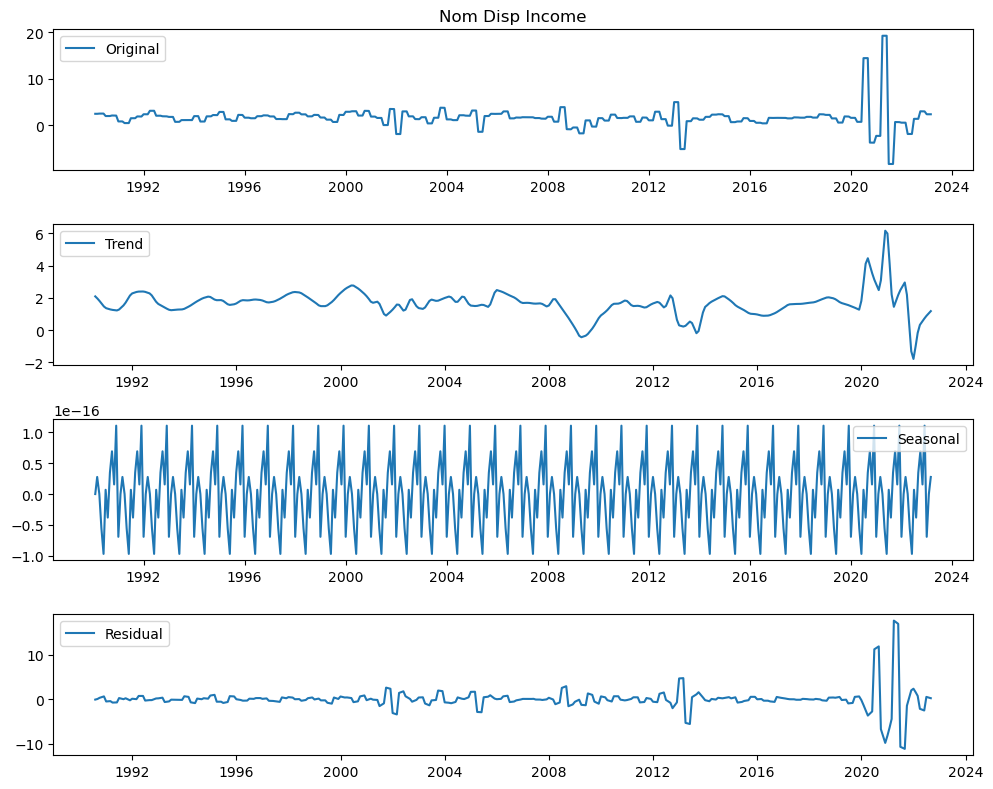

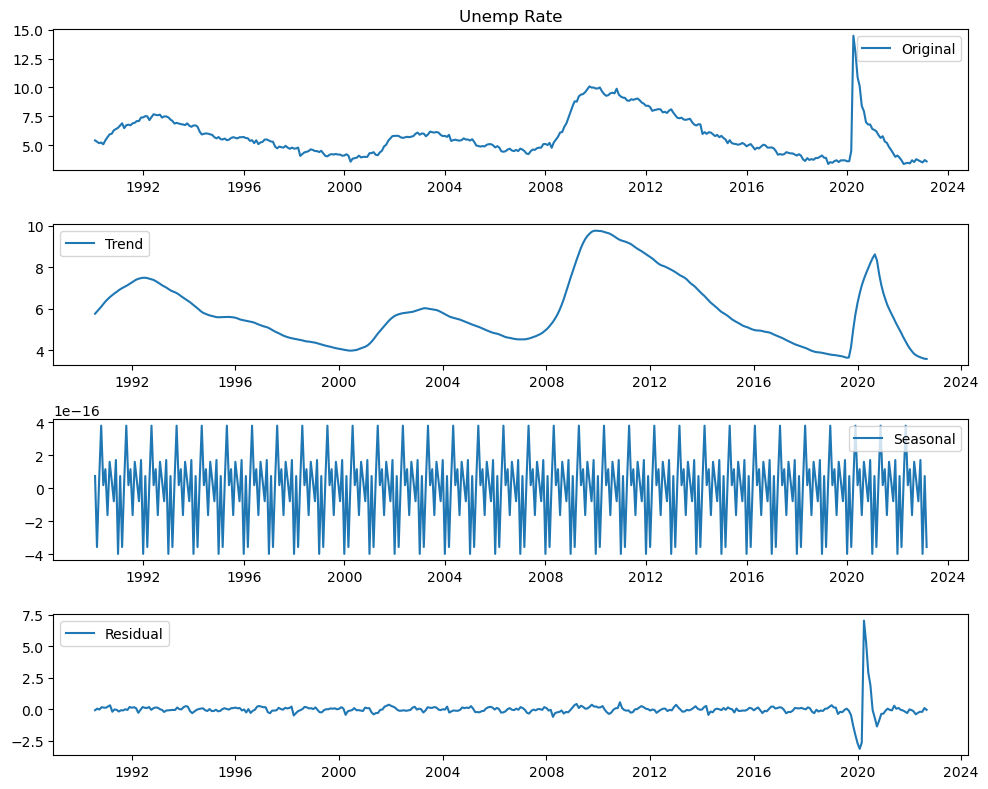

...

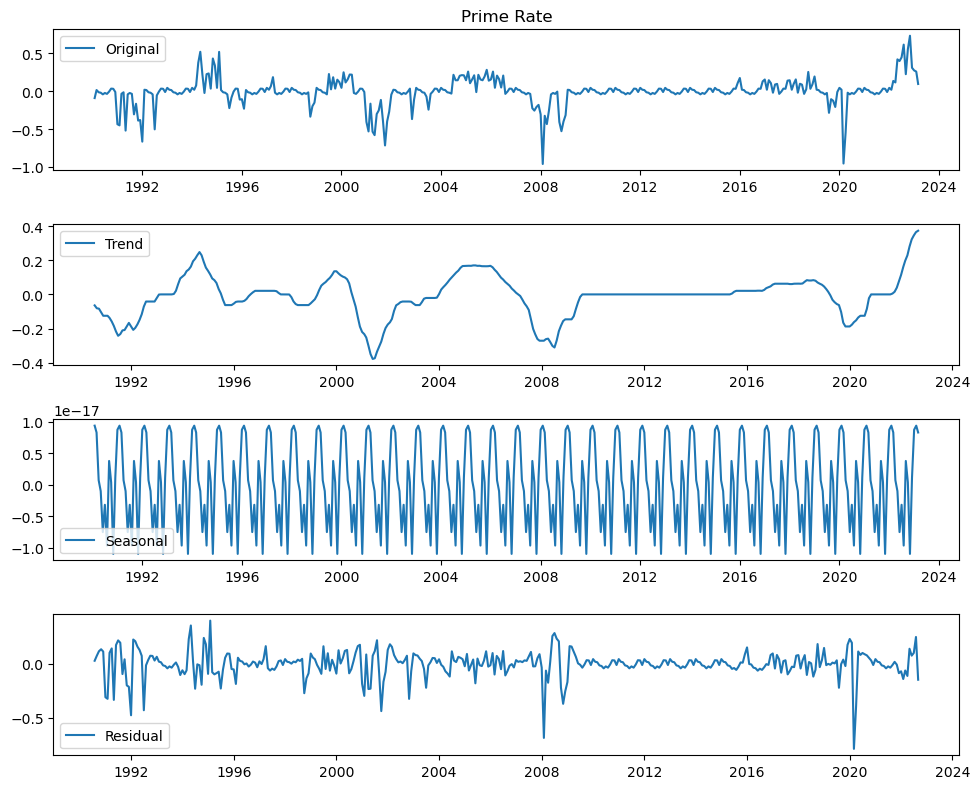

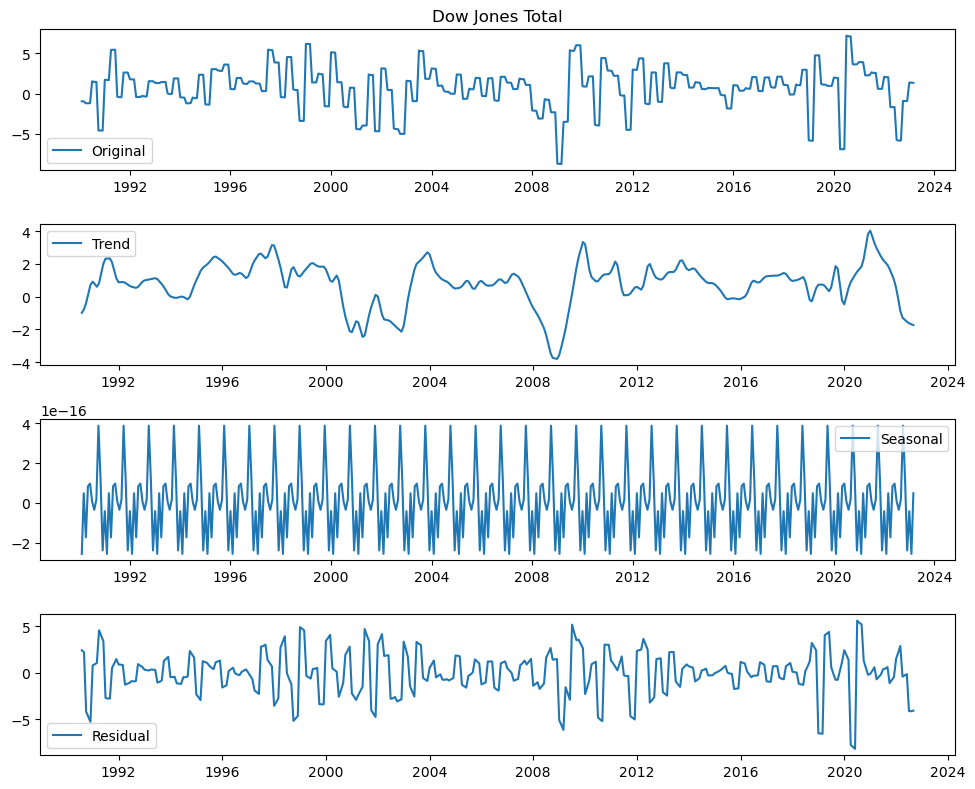

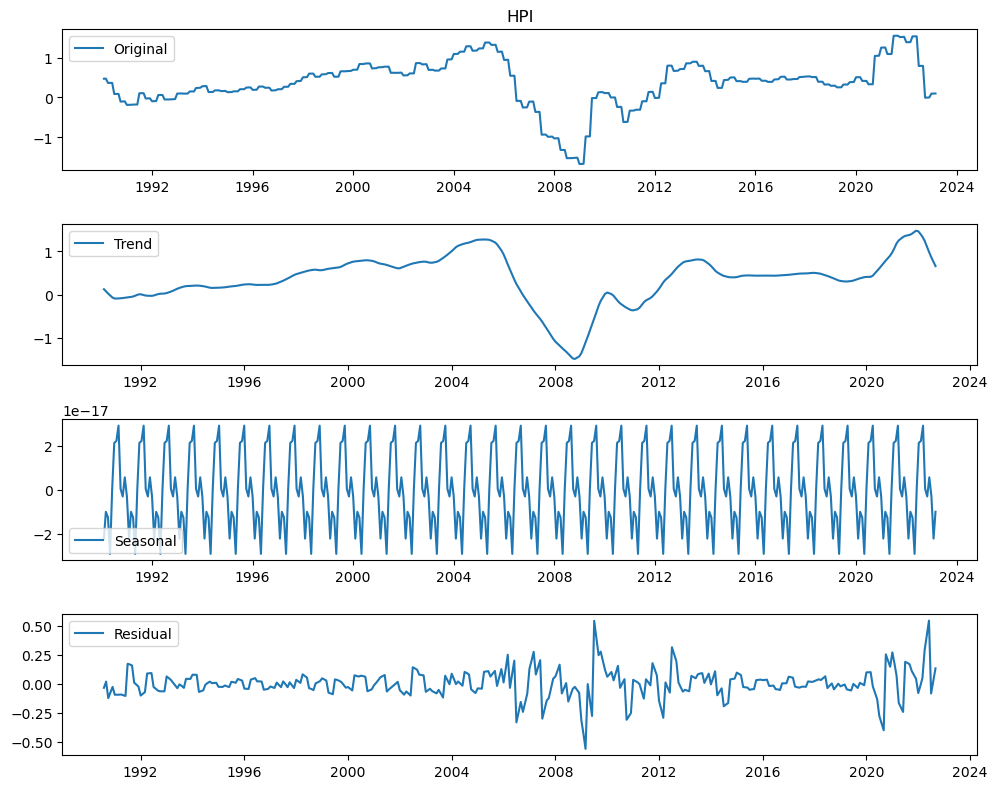

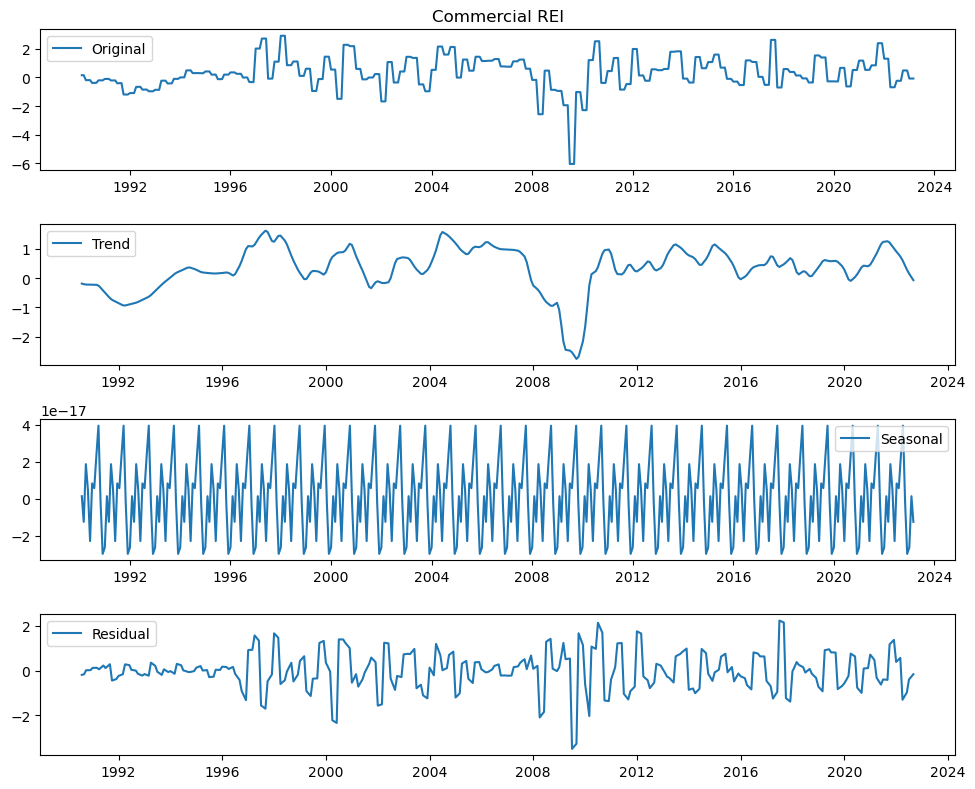

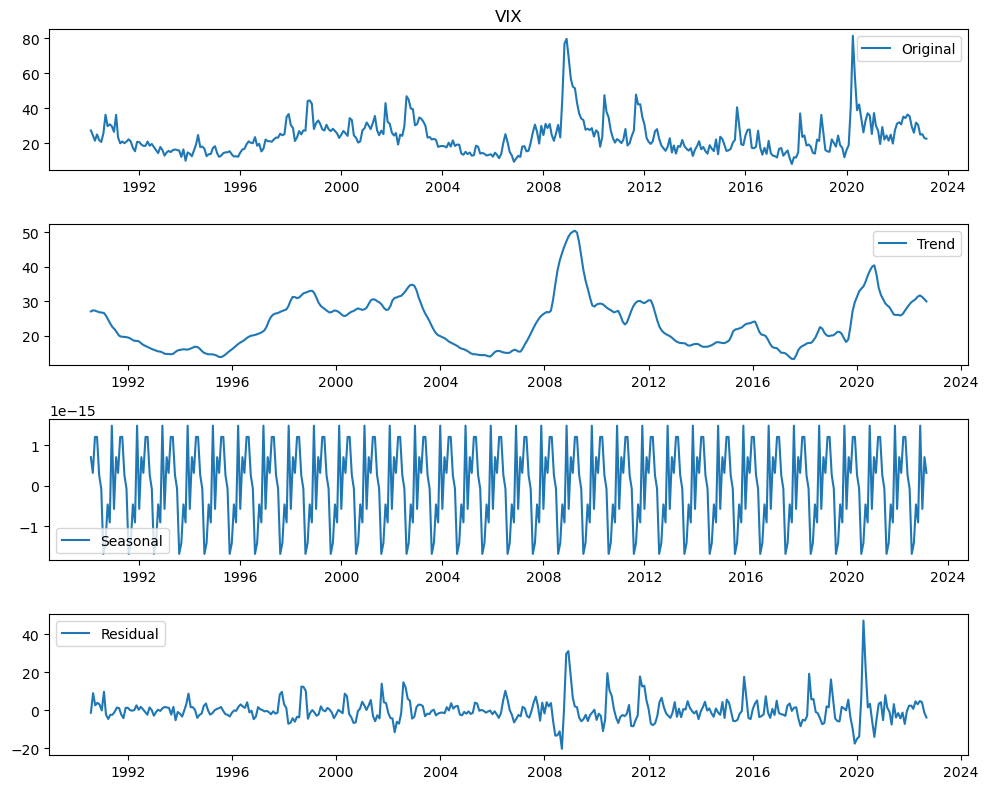

In [62]:
seasonalty_check(ccar_data_stat_seas,'additive')

### Seasonality Check - Additional Data

### Seasonality Removal - Additional Data

## PACF_ACF Plot

### Nonstationary CCAR Data

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


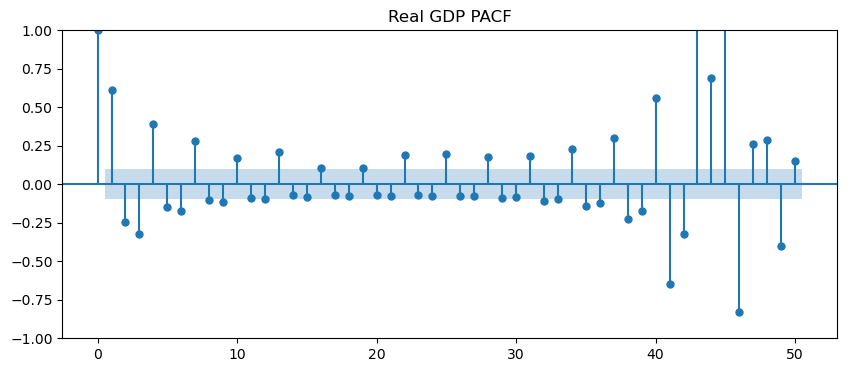

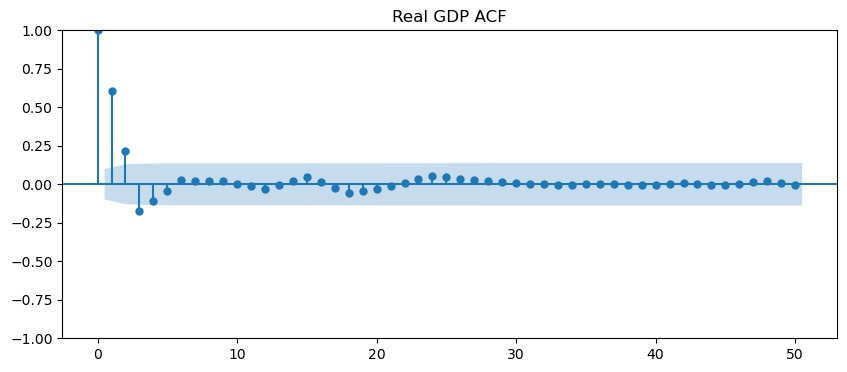

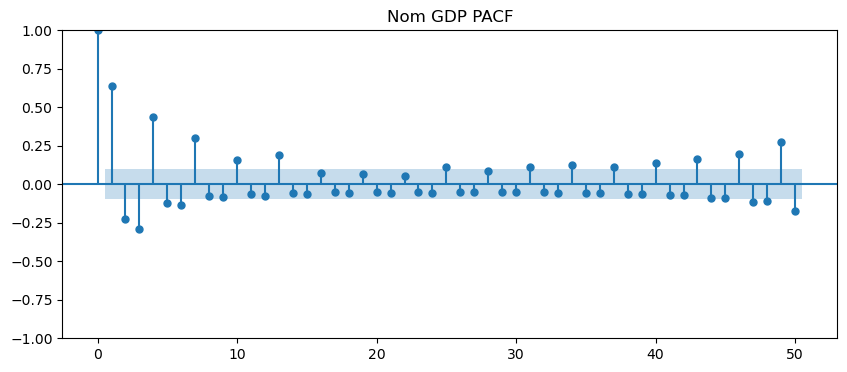

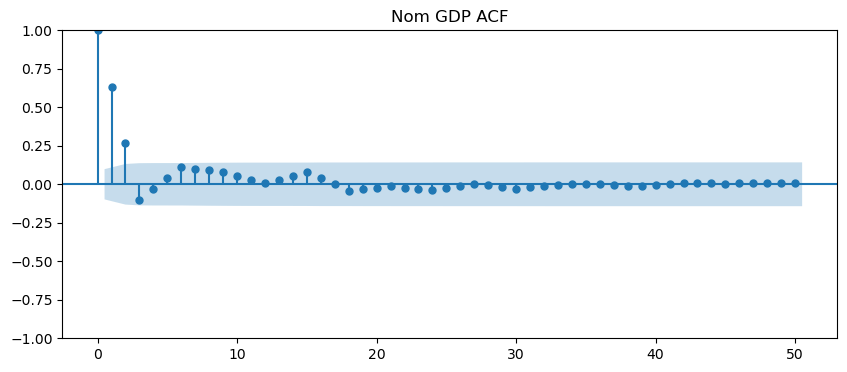

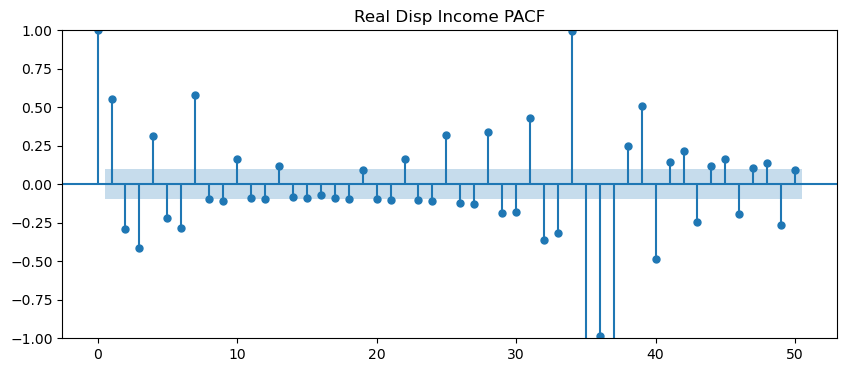

...

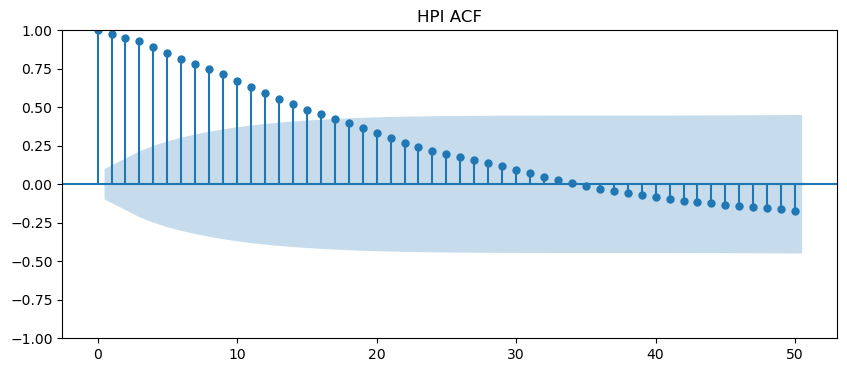

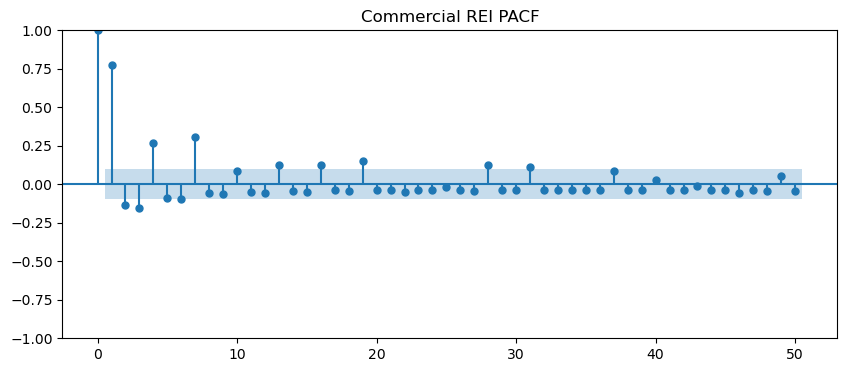

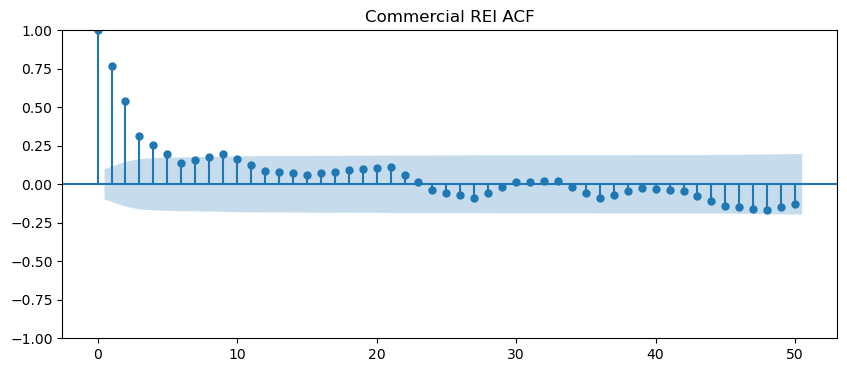

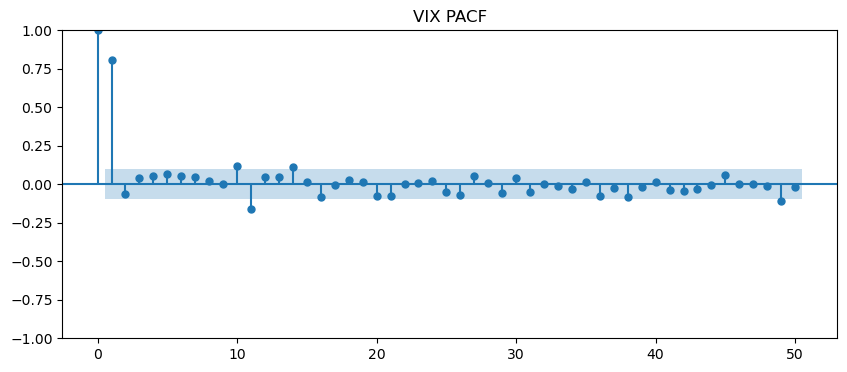

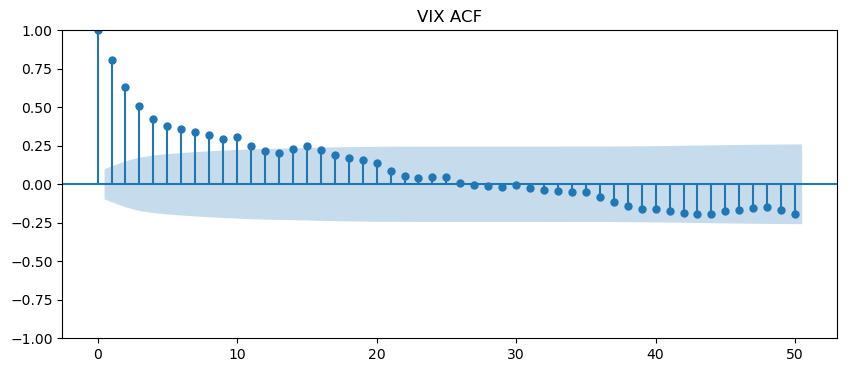

In [64]:
PACF_ACF_plot(ccardata_comb)

### Stationary CCAR Data

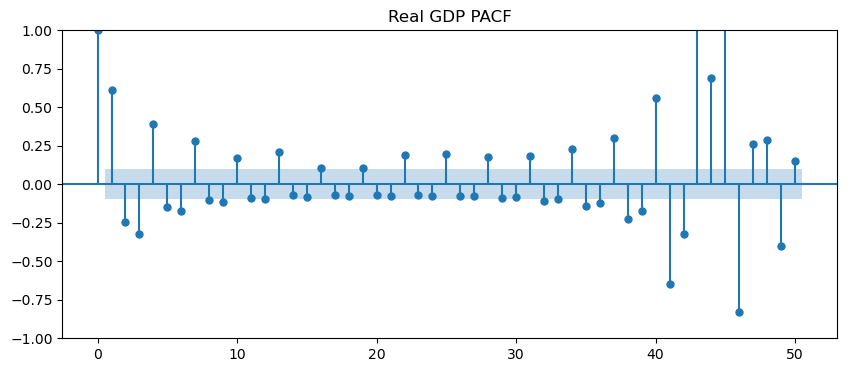

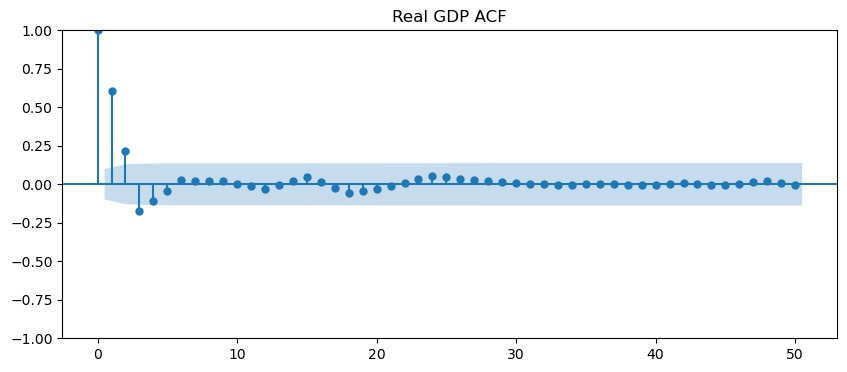

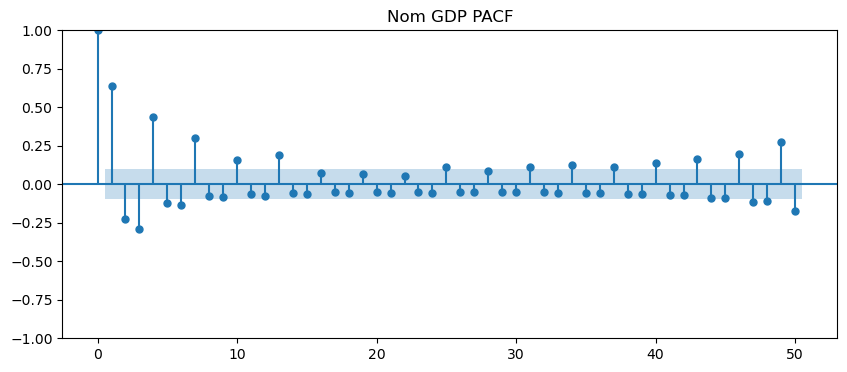

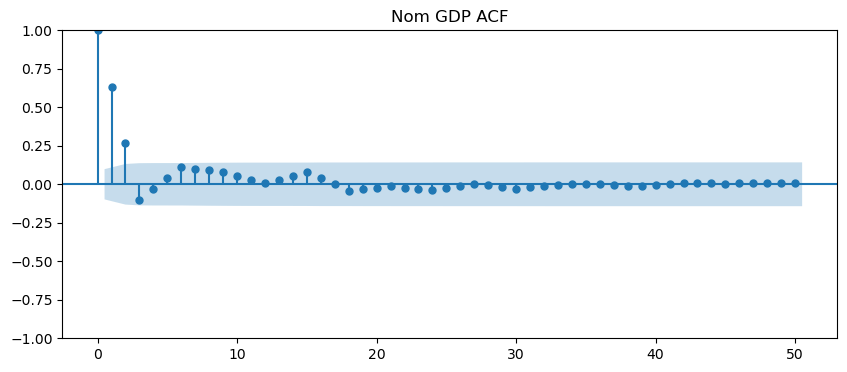

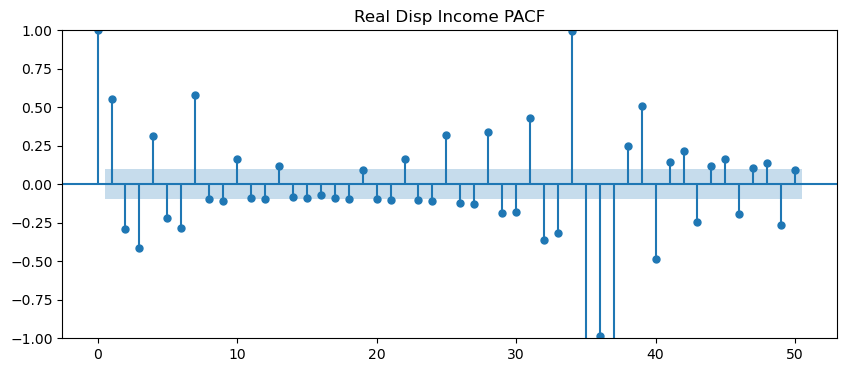

...

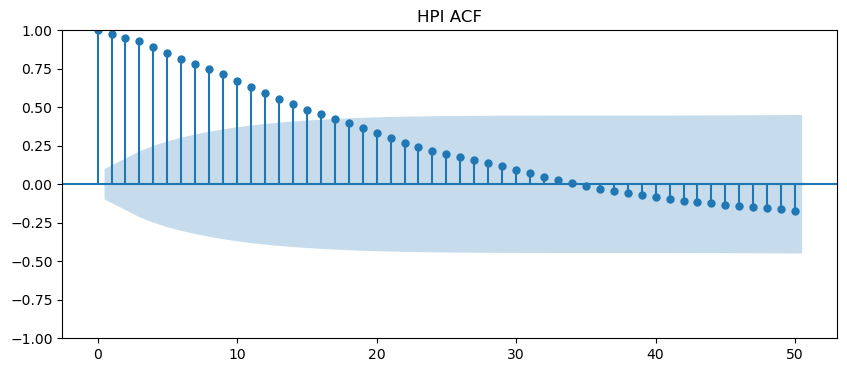

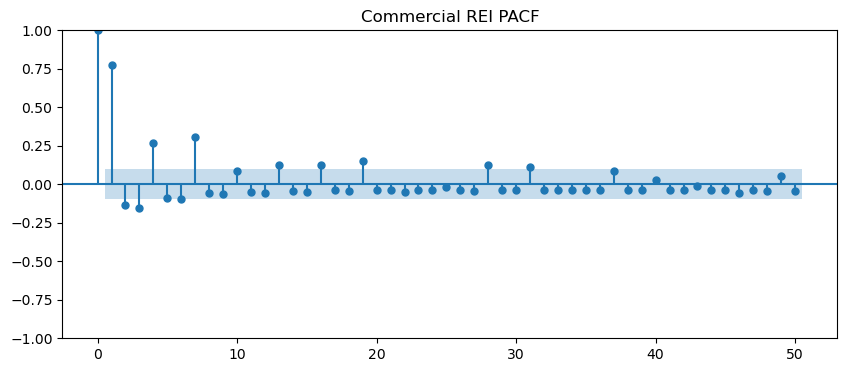

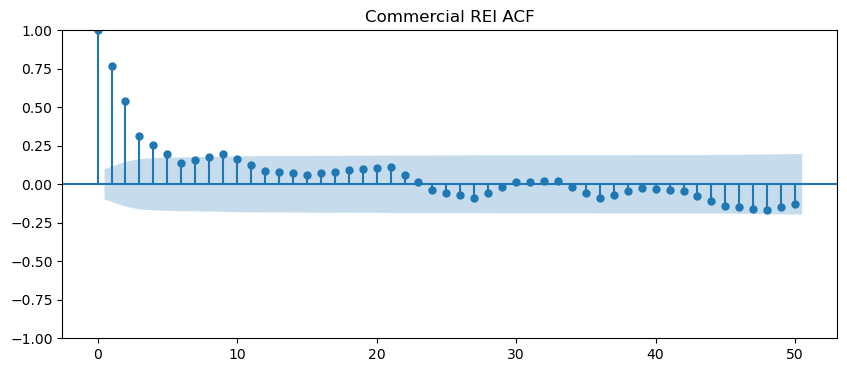

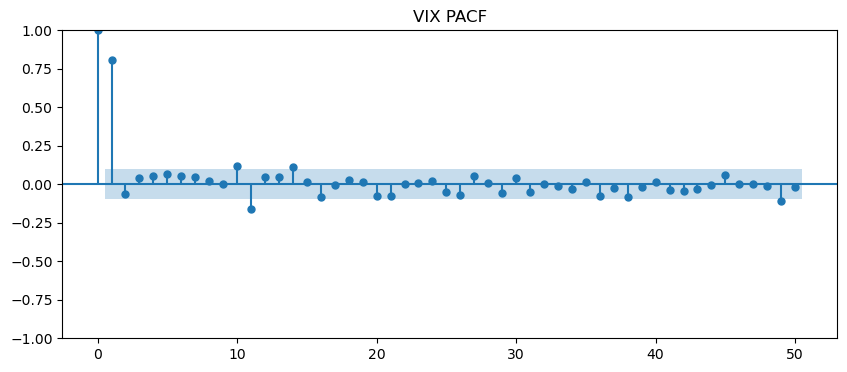

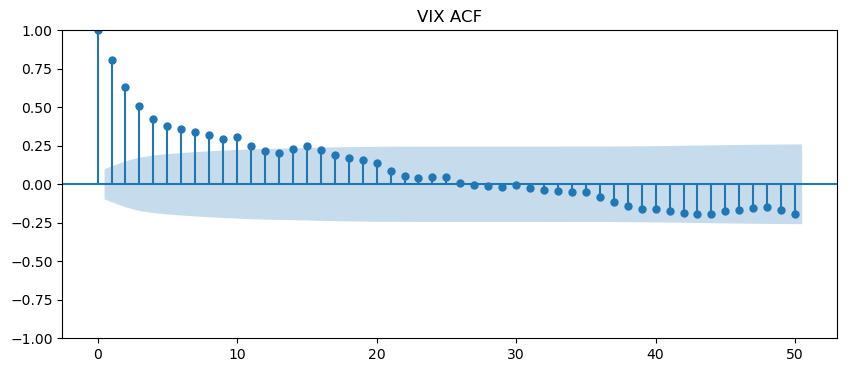

In [65]:
PACF_ACF_plot(ccardata_stationary)

### Nonstationary Additional Variable Data

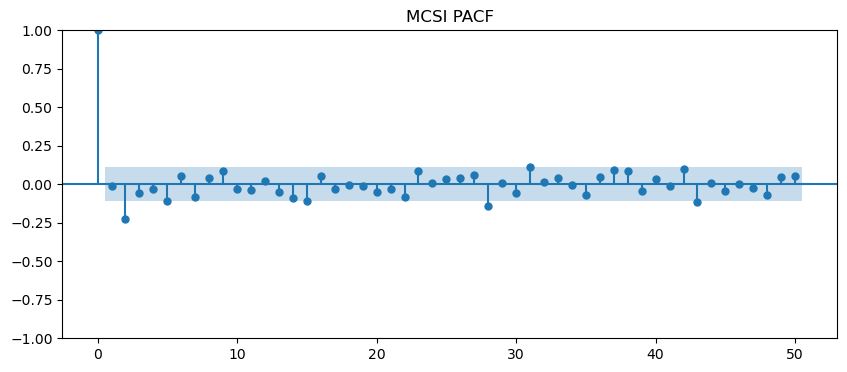

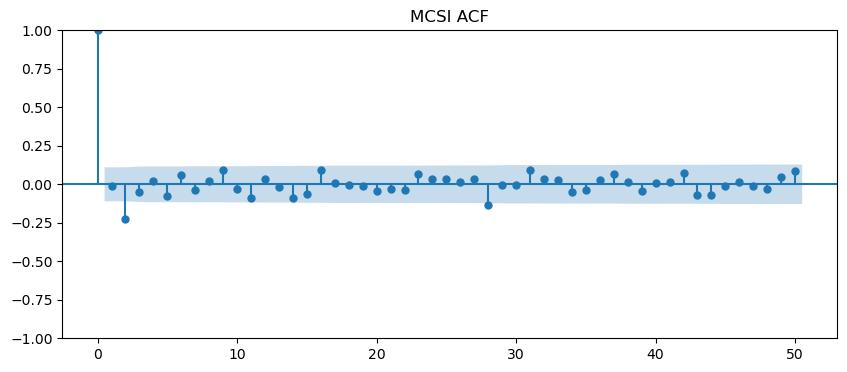

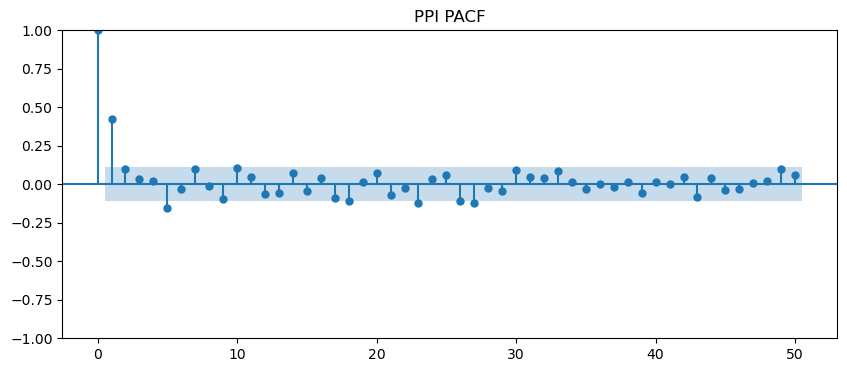

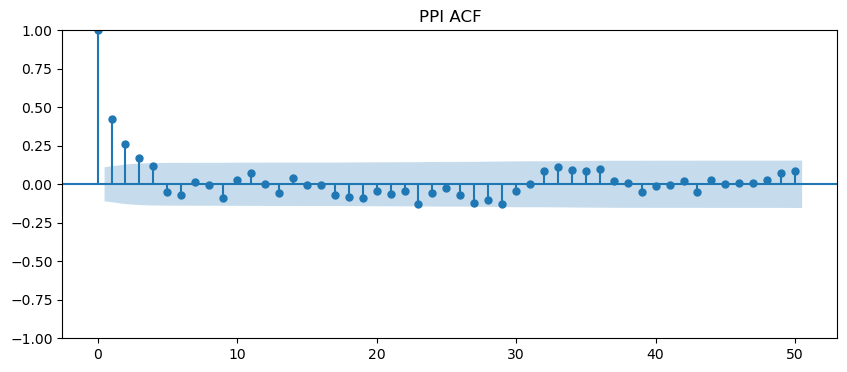

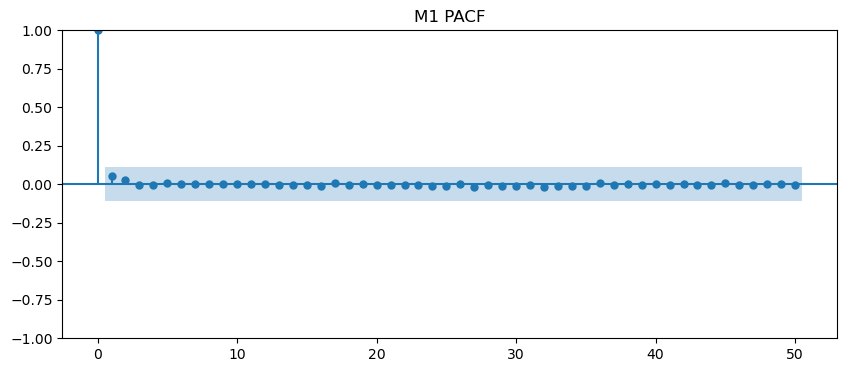

...

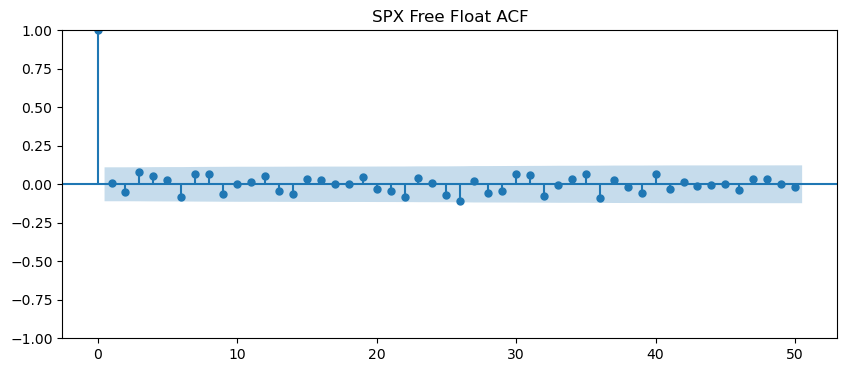

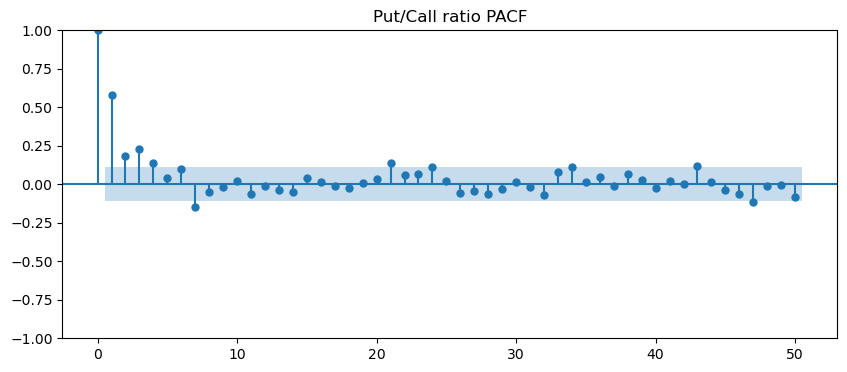

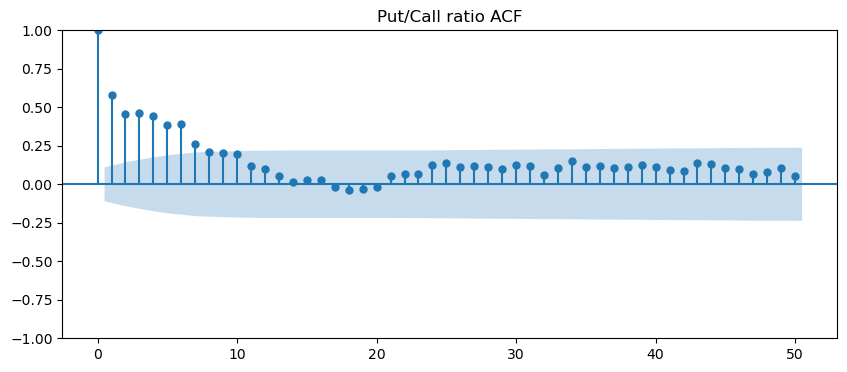

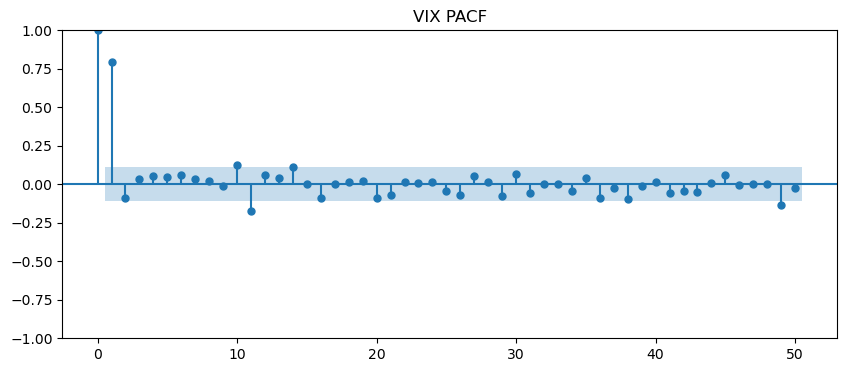

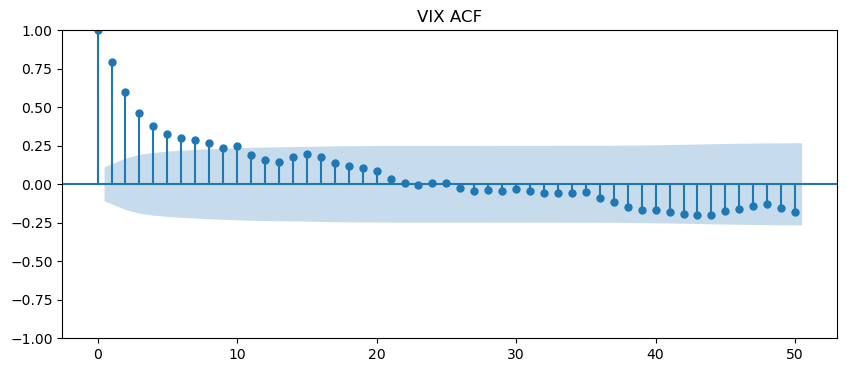

In [66]:
PACF_ACF_plot(add_new)

### Stationary Additional Variable Data

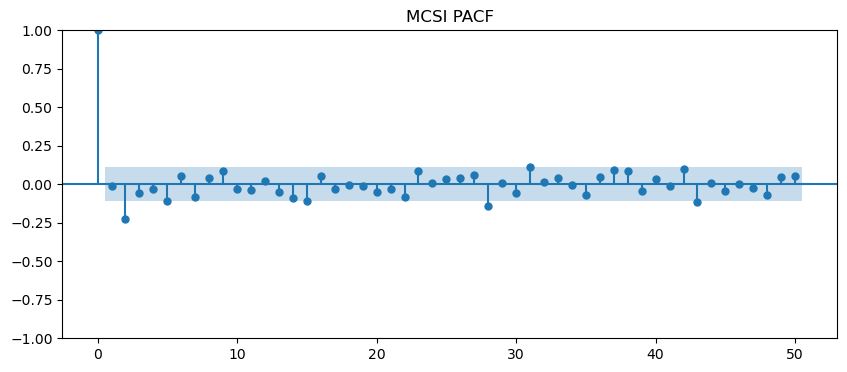

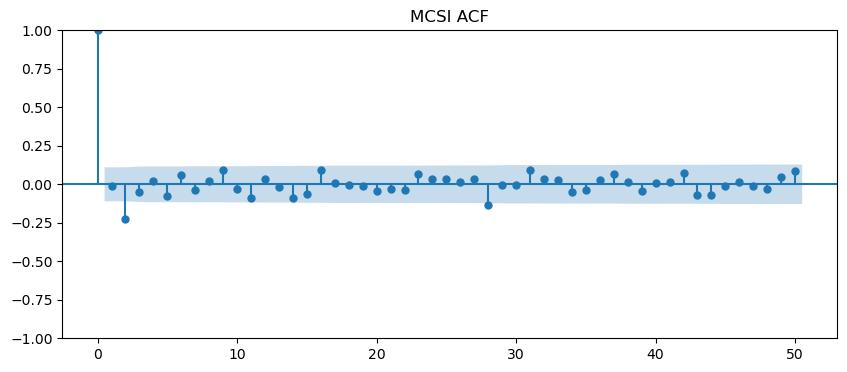

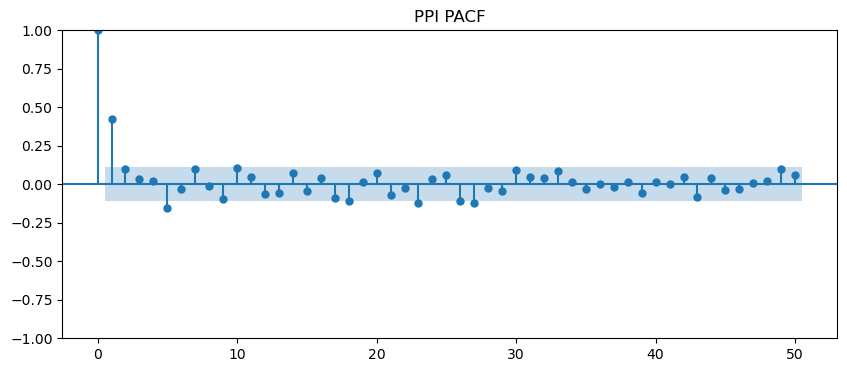

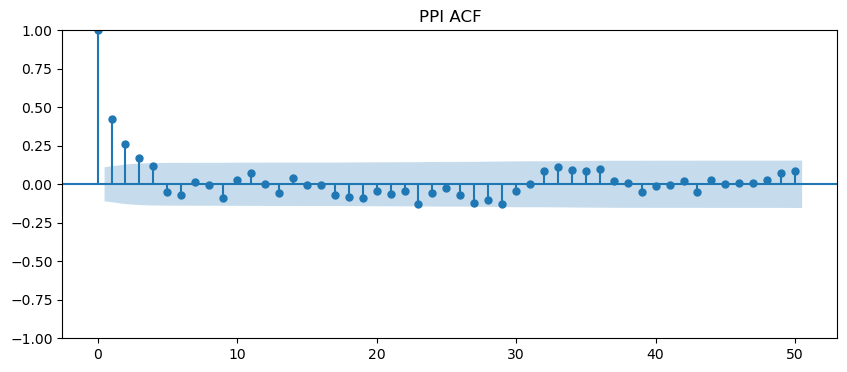

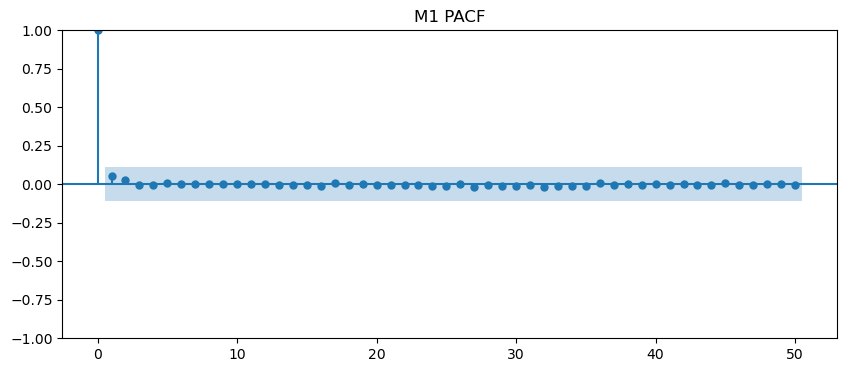

...

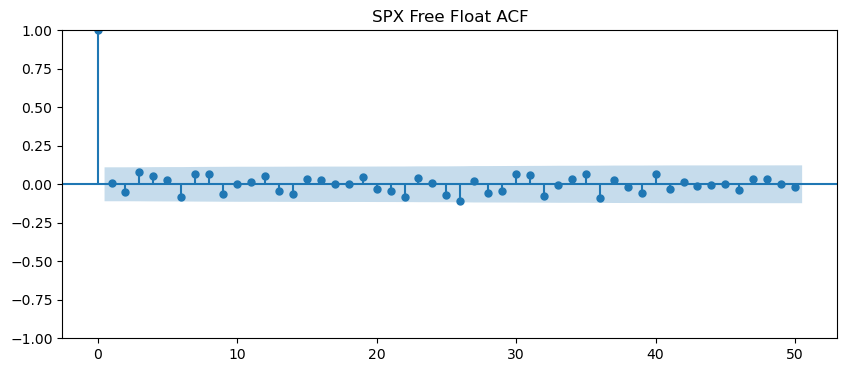

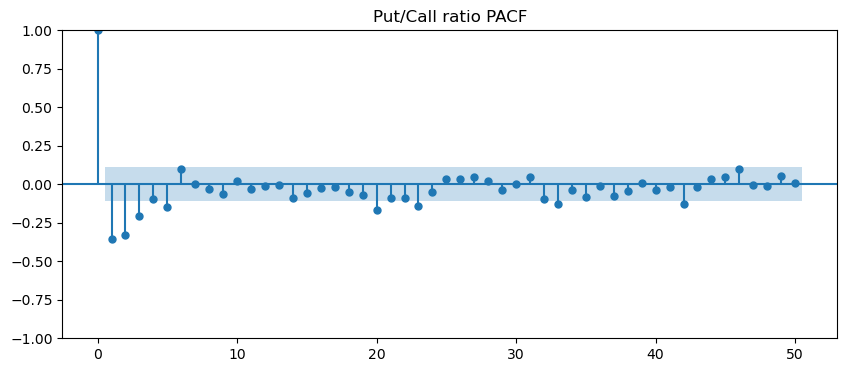

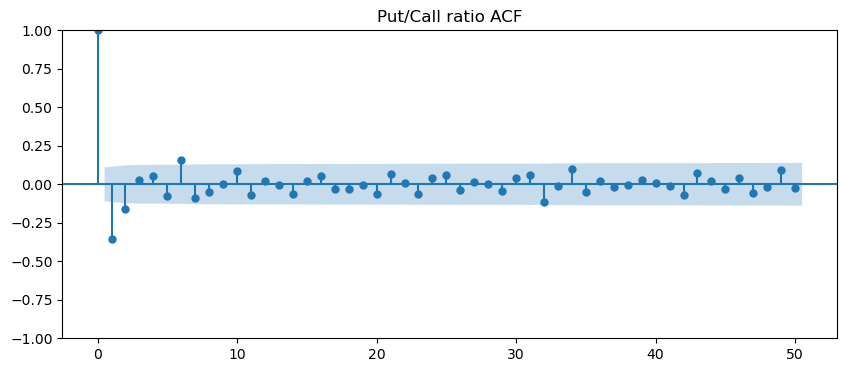

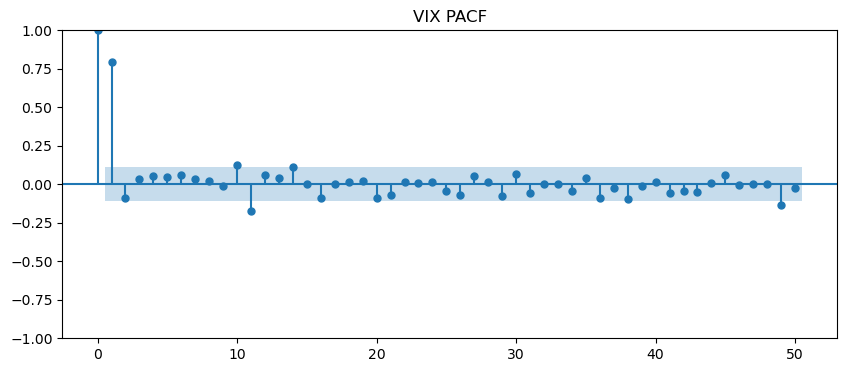

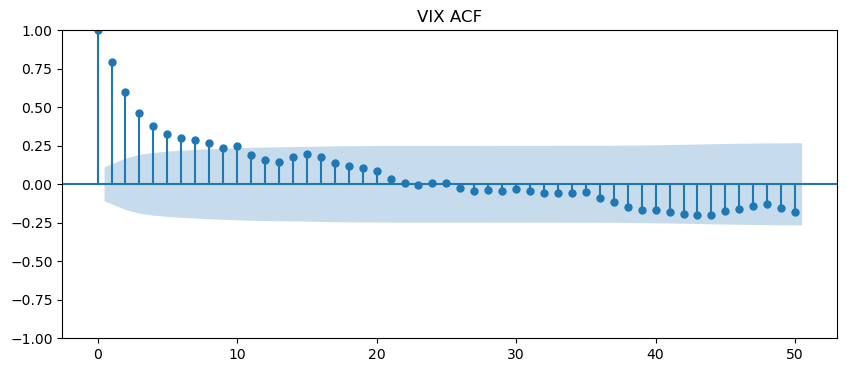

In [67]:
PACF_ACF_plot(ad_new_stationary)

## ARIMA


### ARIMA - Using all CCAR variables (NSA)

In [72]:
ARIMA_order = ARIMA_pdq_order(4,4,4,train_y,test_y)

C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\sauvi\anaconda3\lib\site-packages\statsmodels\tsa\state

In [74]:
ARIMA_order

('Best Order:', (0, 1, 2), 'Best RMSE:', 11.218186811915594)

#### In-sample testing

In [84]:
# Create and fit the ARIMA model
model1 = sm.tsa.ARIMA(train_y, order=ARIMA_order[1])
results1 = model1.fit()
forecast_ARIMA = results1.forecast(steps=len(test_y))
xyz = results1.predict(start = '1990-02-01', end ='2016-07-01')
rmse_in = np.sqrt(mean_squared_error(xyz,train_y))
rmse_in

5.630286707652994

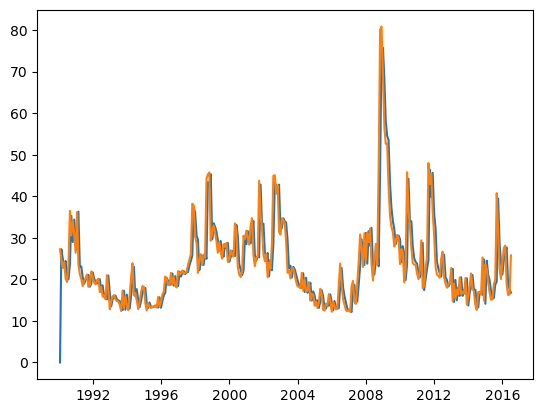

In [85]:
plt.plot(xyz)
plt.plot(train_y)